In [1]:
!pip install nltk
!pip install demoji

In [2]:
import nltk
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
from nltk.corpus import stopwords

stop_words = set(stopwords.words("english"))
nltk.download("wordnet", "whatever_the_absolute_path_to_myapp_is/nltk_data/")
import demoji
import re
import string
from nltk.corpus import stopwords,wordnet
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import TweetTokenizer
from nltk import pos_tag
import attr
import nltk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
%matplotlib inline

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     whatever_the_absolute_path_to_myapp_is/nltk_data/...
[nltk_data]   Package wordnet is already up-to-date!


In [3]:
import nltk
nltk.download('wordnet')
nltk.download('stopwords')
import random
import nltk
import pandas as pd
import os
from nltk.tokenize import regexp_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from matplotlib import pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from urllib import request
from nltk.corpus import gutenberg, stopwords
stop_words = set(stopwords.words('english'))
from sklearn.metrics import cohen_kappa_score
import numpy as np
from collections import Counter
from sklearn.metrics import  silhouette_score
from nltk.tokenize.util import regexp_span_tokenize
from nltk.tokenize.api import TokenizerI
from sklearn.manifold import TSNE
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', None)

In [5]:
# Read the scrapped file
tweets = pd.read_csv('stock_tweets.csv')
tweets.head()
tweets.shape

(80793, 4)

In [6]:
tweets['Stock Name'].unique()

array(['TSLA', 'MSFT', 'PG', 'META', 'AMZN', 'GOOG', 'AMD', 'AAPL',
       'NFLX', 'TSM', 'KO', 'F', 'COST', 'DIS', 'VZ', 'CRM', 'INTC', 'BA',
       'BX', 'NOC', 'PYPL', 'ENPH', 'NIO', 'ZS', 'XPEV'], dtype=object)

In [7]:
tweets['Company Name'].unique()

array(['Tesla, Inc.', 'Microsoft Corporation', 'Procter & Gamble Company',
       'Meta Platforms, Inc.', 'Amazon.com, Inc.', 'Alphabet Inc.',
       'Advanced Micro Devices, Inc.', 'Apple Inc.', 'Netflix, Inc.',
       'Taiwan Semiconductor Manufacturing Company Limited',
       'The Coca-Cola Company', 'Ford Motor Company',
       'Costco Wholesale Corporation', 'The Walt Disney Company',
       'Verizon Communications Inc.', 'Salesforce, Inc.',
       'Intel Corporation', 'The Boeing Company', 'Blackstone Inc.',
       'Northrop Grumman Corporation', 'PayPal Holdings, Inc.',
       'Enphase Energy, Inc.', 'NIO Inc.', 'Zscaler, Inc.', 'XPeng Inc.'],
      dtype=object)

In [8]:
selected_companies = [ 'Alphabet Inc.', 'Meta Platforms, Inc.', 'Amazon.com, Inc.',
                       'Apple Inc.', 'Netflix, Inc.']

tweets = tweets[tweets["Company Name"].isin(selected_companies)]

tweets

,Date,Tweet,Stock Name,Company Name
45600,2022-09-29 19:07:54+00:00,"*META ANNOUNCES HIRING FREEZE, WARNS EMPLOYEES OF RESTRUCTURING\n\n$META $FB https://t.co/7ndrg7yUjL",META,"Meta Platforms, Inc."
45601,2022-09-25 14:34:16+00:00,Year-to-Date Performance:\n\n1. $FB: -59%\n2. $AAPL: -17%\n3. $AMZN: -33%\n4. $NFLX: -62%\n5. $GOOGL: -32%\n6. $TSLA: -31%\n7. $MSFT: -29%\n8. $DIS: -36%\n9. $NVDA: -58%\n10. $BABA: -35%\n11. $PYPL: -55%\n\nImagine the damage once housing prices crash next.\n\nThe bubble is officially bursting.,META,"Meta Platforms, Inc."
45602,2022-09-22 21:51:28+00:00,"Year-to-Date performance:\n\n1. $FB: -58%\n2. $AMZN: -31%\n3. $AAPL: -16%\n4. $NFLX: -60%\n5. $GOOGL: -31%\n6. $MSFT: -28%\n7. $TSLA: -28%\n8. $F: -41%\n9. $PYPL: -55%\n\nAll FAANG stocks, aside from $AAPL, are now in bear market territory.\n\nThe fact that $SPX isn’t down 30%+ is a miracle.",META,"Meta Platforms, Inc."
45603,2022-09-22 16:18:00+00:00,$EPAZ DeskFlex Metaverse Office Technology offers businesses an exciting way to merge the current environment of remote and in-person workplaces. #Meta $FB $MSFT $MTTR $ADBE $NVDA $U https://t.co/XiiqiLPP02,META,"Meta Platforms, Inc."
45604,2022-09-22 07:15:57+00:00,⚠️BREAKING:\n\n*META STOCK CRASHES TO LOWEST LEVEL SINCE MARCH 2020\n\n$META $FB https://t.co/FpCpfpYPLH,META,"Meta Platforms, Inc."
...,...,...,...,...
62736,2021-09-30 23:07:48+00:00,New billboard out on Sunset Blvd. today from $NFLX https://t.co/spKkTHh2Il,NFLX,"Netflix, Inc."
62737,2021-09-30 22:53:50+00:00,"♠️#LottoFriday♠️\n\nHigh risk, secure profits!\n\n$QQQ 363C &gt;362.68 | 357P &lt;351.1\n$MSFT 290C &gt;286.68 | 275P &lt;280\n\n$TSLA 790C &gt;789.13 | 765P &lt;770\n$NFLX 620C &gt;619 | 595P &lt;600\n\n$MRNA 400C &gt;390 | 375P &lt;380\n$CHWY 70c &gt;69.09 | 65P &lt;67.58\n\nHave a wonderful Friday!♠️",NFLX,"Netflix, Inc."
62738,2021-09-30 18:01:19+00:00,"Returns over the last 10 Years:\n\nBitcoin $BTC: +994,608%\nTesla $TSLA: +15,200%\nNVIDIA $NVDA: +6,053%\nNetflix $NFLX: +2,337%\nAmazon $AMZN: +1,427%\nApple $AAPL: +1,112%\nS&amp;P 500 $SPY: +344%\nBonds $AGG: +35%\nGold $GLD: -6%\n\n@PeterSchiff literally picked the worst performing asset.",NFLX,"Netflix, Inc."
62739,2021-09-30 07:01:39+00:00,You got to love this motivational quote. Netflix $NFLX. https://t.co/shWoNI2SXB,NFLX,"Netflix, Inc."


In [9]:
tweets['Company Name'].unique()

array(['Meta Platforms, Inc.', 'Amazon.com, Inc.', 'Alphabet Inc.',
       'Apple Inc.', 'Netflix, Inc.'], dtype=object)

In [10]:

tweets['Date'] = pd.to_datetime(tweets['Date'])

# Extract the year from the 'Date' column and get unique years
unique_years = tweets['Date'].dt.year.unique()

print(unique_years)

[2022 2021]


<ipython-input-10-012734a8fa19>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets['Date'] = pd.to_datetime(tweets['Date'])


#2)Data Visualization

The code counts the number of tweets for each company and creates a bar plot to visualize the tweet counts.

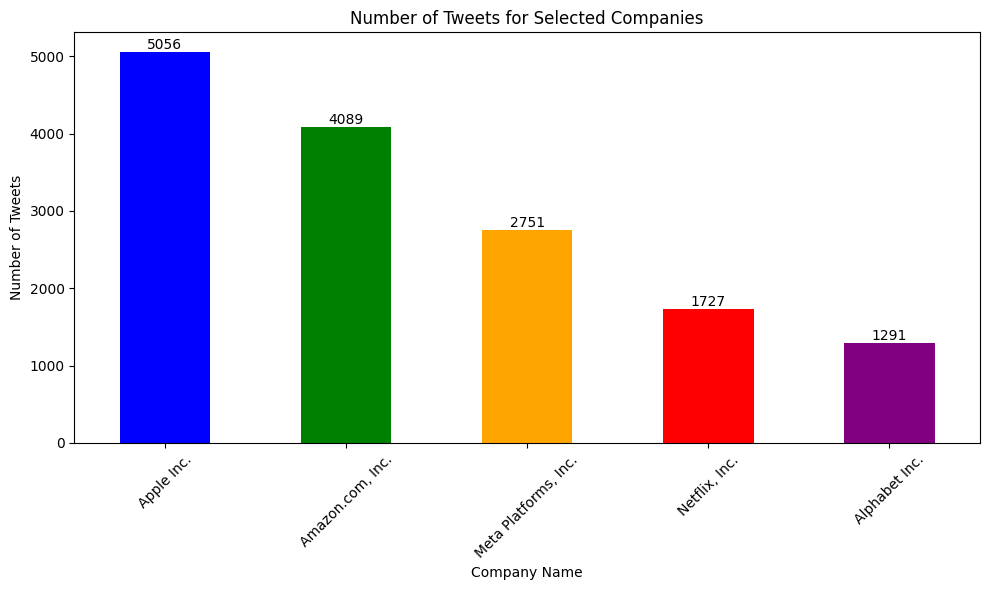

In [11]:
selected_tweets = pd.DataFrame(tweets)
tweet_counts = selected_tweets["Company Name"].value_counts()
plt.figure(figsize=(10, 6))

colors = ['blue', 'green', 'orange', 'red', 'purple', 'pink', 'brown', 'gray']
ax = tweet_counts.plot(kind='bar', color=colors)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.title('Number of Tweets for Selected Companies')
plt.xlabel('Company Name')
plt.ylabel('Number of Tweets')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

we first groups the tweets by company name and then generate a separate word cloud for each group of tweets related to a particular company

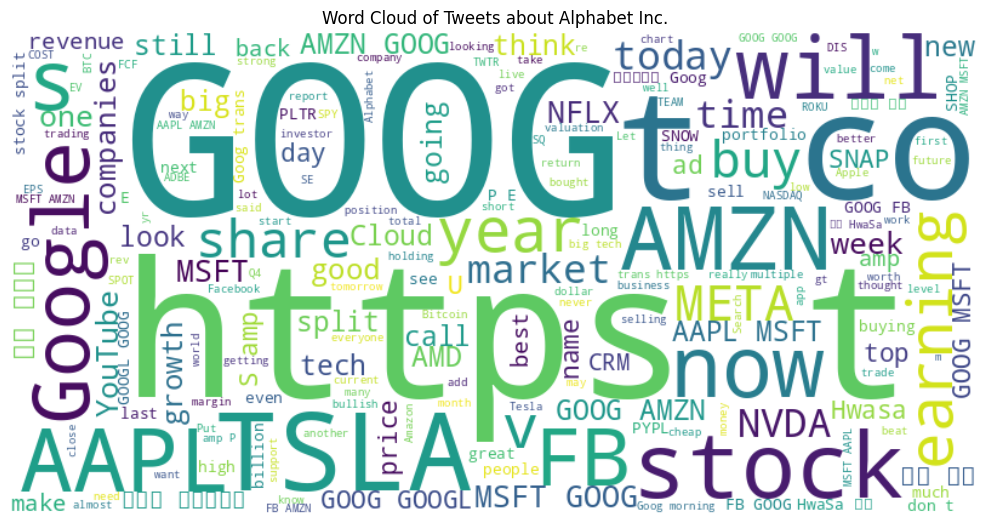

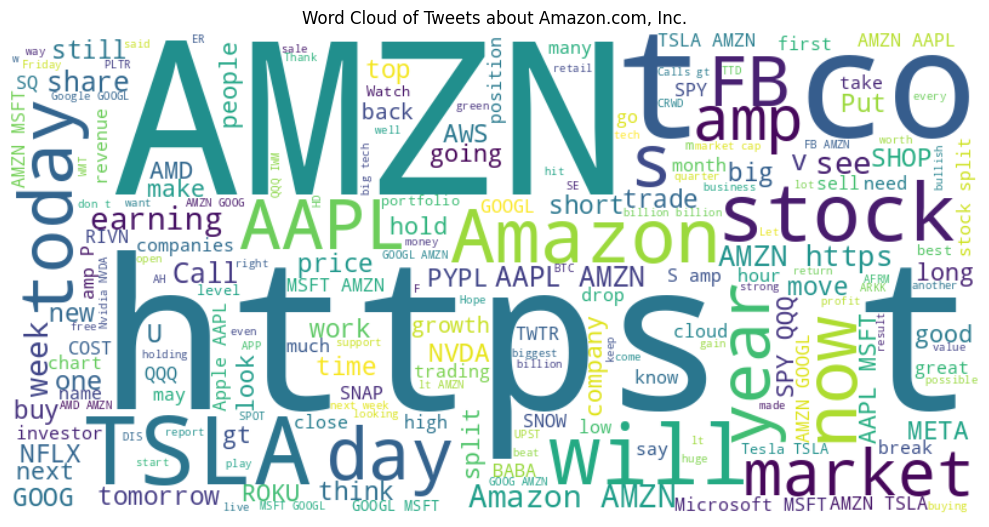

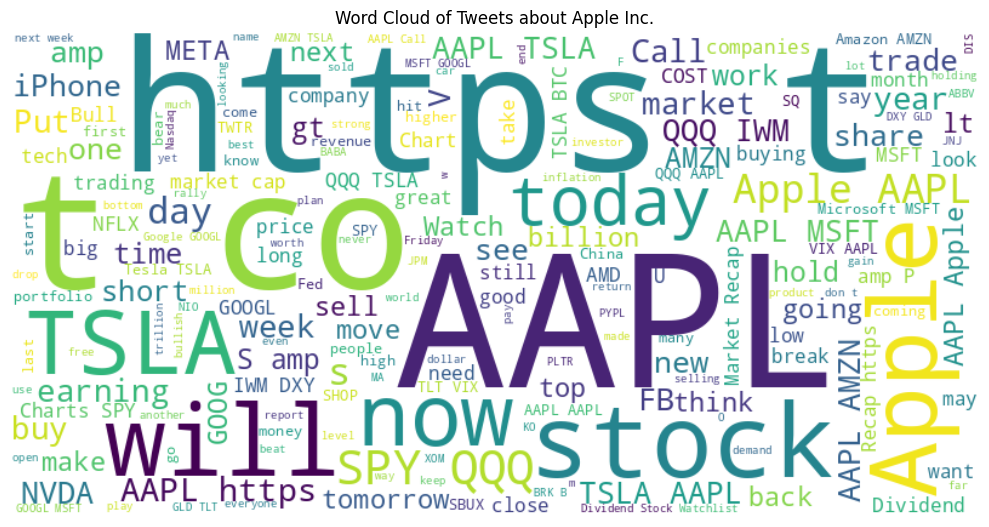

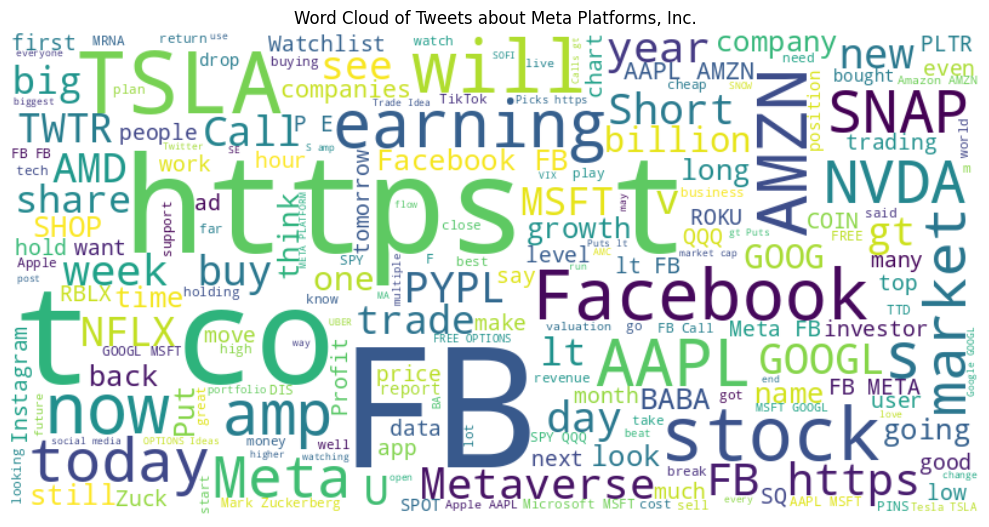

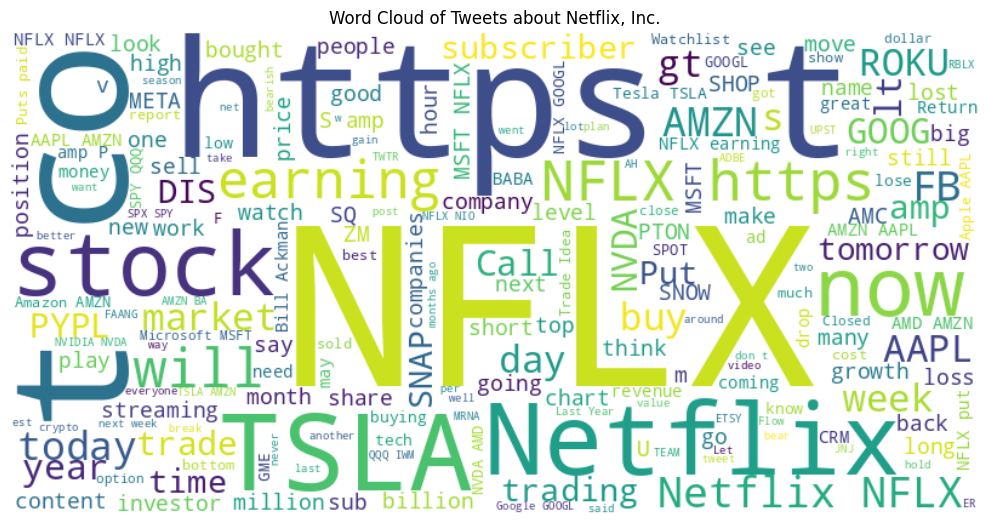

In [12]:
from wordcloud import WordCloud
grouped_tweets = tweets.groupby("Company Name")

for company, group in grouped_tweets:
    company_tweets = ' '.join(group["Tweet"])

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(company_tweets)

    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud of Tweets about {company}')
    plt.axis('off')
    plt.tight_layout()

    plt.show()

a histogram where each histogram corresponds to the character lengths of tweets for a specific company.

<ipython-input-13-0e23bd8ec398>:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.hist(company_data['char_length'], alpha=0.7, label=company, bins=20, color=plt.cm.get_cmap('Set1')(label/len(Company_dic)))


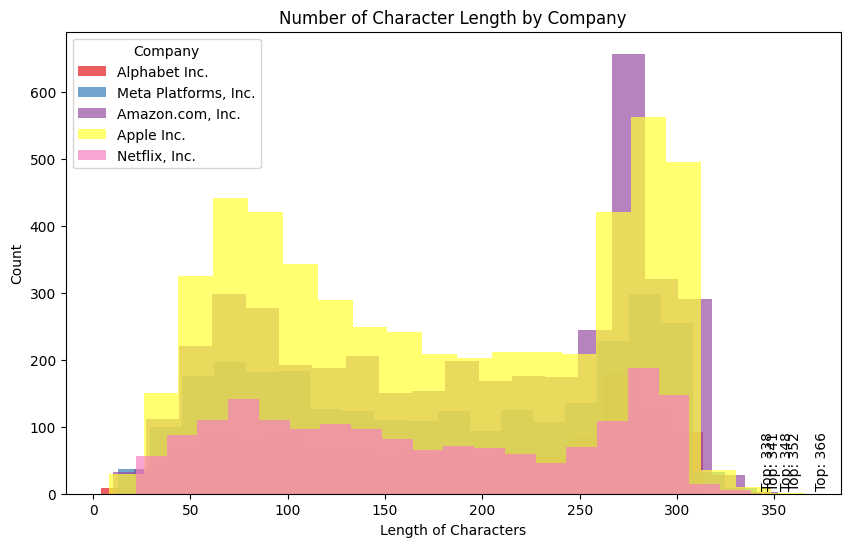

In [13]:
df_tweets = pd.DataFrame(tweets)

Company_dic = {
    'Alphabet Inc.': 0,
    'Meta Platforms, Inc.': 1,
    'Amazon.com, Inc.': 2,
    'Apple Inc.': 3,
    'Netflix, Inc.': 4
}

df_tweets['char_length'] = df_tweets['Tweet'].apply(len)

plt.figure(figsize=(10, 6))
for company, label in Company_dic.items():
    company_data = df_tweets[df_tweets['Company Name'] == company]
    plt.hist(company_data['char_length'], alpha=0.7, label=company, bins=20, color=plt.cm.get_cmap('Set1')(label/len(Company_dic)))

    top_char_length = company_data['char_length'].max()
    plt.text(top_char_length + 5, 10, f'Top: {top_char_length}', rotation=90, color='black')

plt.legend(title='Company')
plt.title('Number of Character Length by Company')
plt.xlabel('Length of Characters')
plt.ylabel('Count')
plt.show()

we extracts hashtags from the tweets, count their occurrences for each company, and then creates horizontal bar charts to compare the top hashtags used in tweets about each company.

<ipython-input-14-e8a408efb91a>:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.barh(hashtags, counts, color=plt.cm.get_cmap('Set3')(label/len(Company_dic)), label=company)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54868 (\N{HANGUL SYLLABLE HWA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 21326 (\N{CJK UNIFIED IDEOGRAPH-534E}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py

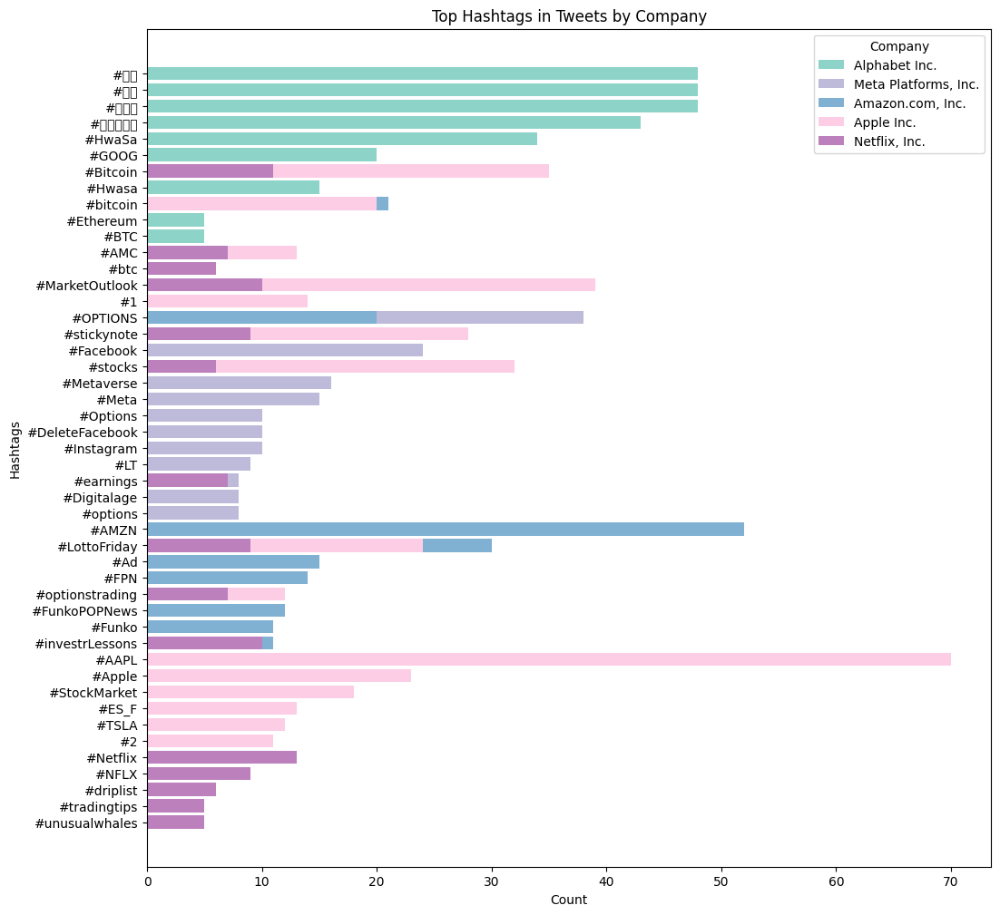

In [14]:
from collections import Counter
import re



Company_dic = {
    'Alphabet Inc.': 0,
    'Meta Platforms, Inc.': 1,
    'Amazon.com, Inc.': 2,
    'Apple Inc.': 3,
    'Netflix, Inc.': 4
}

company_hashtags = {company: Counter() for company in Company_dic}

for index, row in df_tweets.iterrows():
    company = row['Company Name']
    hashtags = re.findall(r'#\w+', row['Tweet'])
    company_hashtags[company].update(hashtags)

plt.figure(figsize=(12, 12))
for company, label in Company_dic.items():
    top_hashtags = company_hashtags[company].most_common(15)
    hashtags, counts = zip(*top_hashtags)

    plt.barh(hashtags, counts, color=plt.cm.get_cmap('Set3')(label/len(Company_dic)), label=company)

plt.legend(title='Company')
plt.title('Top Hashtags in Tweets by Company')
plt.xlabel('Count')
plt.ylabel('Hashtags')
plt.gca().invert_yaxis()
plt.show()


we perform text preprocessing, tokenize the tweets, and count word frequencies for each company. The top 20 most frequent words are plotted in a bar chart for each company.

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


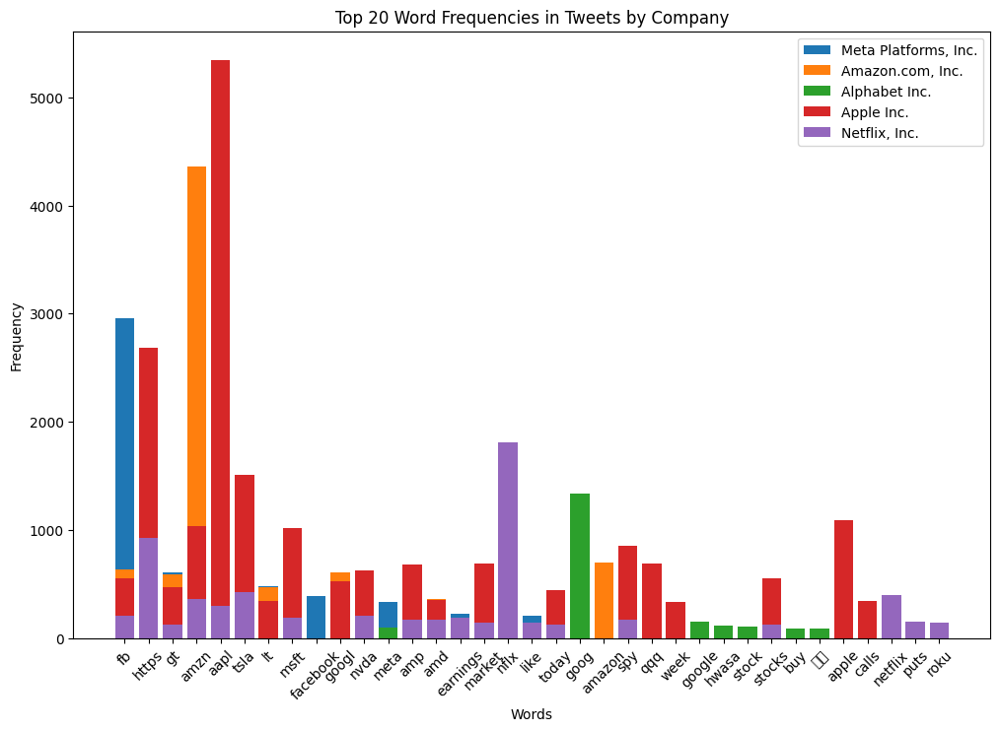

In [15]:
import pandas as pd
import re
from collections import defaultdict
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import matplotlib.pyplot as plt


# Create a dictionary to store word frequencies for each company
company_word_freq = {company: defaultdict(int) for company in df_tweets["Company Name"].unique()}

nltk.download('punkt')
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

# Tokenize and count word frequencies for each company
for _, row in df_tweets.iterrows():
    company = row["Company Name"]
    tweet = row["Tweet"]
    words = word_tokenize(tweet)
    words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]

    for word in words:
        company_word_freq[company][word] += 1

# Create a word frequency bar chart for each company
plt.figure(figsize=(12, 8))
for company, word_freq in company_word_freq.items():
    top_words = dict(sorted(word_freq.items(), key=lambda item: item[1], reverse=True)[:20])
    plt.bar(top_words.keys(), top_words.values(), label=company)

plt.legend()
plt.title('Top 20 Word Frequencies in Tweets by Company')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

In [16]:
tweets.drop('char_length',axis=1)

,Date,Tweet,Stock Name,Company Name
45600,2022-09-29 19:07:54+00:00,"*META ANNOUNCES HIRING FREEZE, WARNS EMPLOYEES OF RESTRUCTURING\n\n$META $FB https://t.co/7ndrg7yUjL",META,"Meta Platforms, Inc."
45601,2022-09-25 14:34:16+00:00,Year-to-Date Performance:\n\n1. $FB: -59%\n2. $AAPL: -17%\n3. $AMZN: -33%\n4. $NFLX: -62%\n5. $GOOGL: -32%\n6. $TSLA: -31%\n7. $MSFT: -29%\n8. $DIS: -36%\n9. $NVDA: -58%\n10. $BABA: -35%\n11. $PYPL: -55%\n\nImagine the damage once housing prices crash next.\n\nThe bubble is officially bursting.,META,"Meta Platforms, Inc."
45602,2022-09-22 21:51:28+00:00,"Year-to-Date performance:\n\n1. $FB: -58%\n2. $AMZN: -31%\n3. $AAPL: -16%\n4. $NFLX: -60%\n5. $GOOGL: -31%\n6. $MSFT: -28%\n7. $TSLA: -28%\n8. $F: -41%\n9. $PYPL: -55%\n\nAll FAANG stocks, aside from $AAPL, are now in bear market territory.\n\nThe fact that $SPX isn’t down 30%+ is a miracle.",META,"Meta Platforms, Inc."
45603,2022-09-22 16:18:00+00:00,$EPAZ DeskFlex Metaverse Office Technology offers businesses an exciting way to merge the current environment of remote and in-person workplaces. #Meta $FB $MSFT $MTTR $ADBE $NVDA $U https://t.co/XiiqiLPP02,META,"Meta Platforms, Inc."
45604,2022-09-22 07:15:57+00:00,⚠️BREAKING:\n\n*META STOCK CRASHES TO LOWEST LEVEL SINCE MARCH 2020\n\n$META $FB https://t.co/FpCpfpYPLH,META,"Meta Platforms, Inc."
...,...,...,...,...
62736,2021-09-30 23:07:48+00:00,New billboard out on Sunset Blvd. today from $NFLX https://t.co/spKkTHh2Il,NFLX,"Netflix, Inc."
62737,2021-09-30 22:53:50+00:00,"♠️#LottoFriday♠️\n\nHigh risk, secure profits!\n\n$QQQ 363C &gt;362.68 | 357P &lt;351.1\n$MSFT 290C &gt;286.68 | 275P &lt;280\n\n$TSLA 790C &gt;789.13 | 765P &lt;770\n$NFLX 620C &gt;619 | 595P &lt;600\n\n$MRNA 400C &gt;390 | 375P &lt;380\n$CHWY 70c &gt;69.09 | 65P &lt;67.58\n\nHave a wonderful Friday!♠️",NFLX,"Netflix, Inc."
62738,2021-09-30 18:01:19+00:00,"Returns over the last 10 Years:\n\nBitcoin $BTC: +994,608%\nTesla $TSLA: +15,200%\nNVIDIA $NVDA: +6,053%\nNetflix $NFLX: +2,337%\nAmazon $AMZN: +1,427%\nApple $AAPL: +1,112%\nS&amp;P 500 $SPY: +344%\nBonds $AGG: +35%\nGold $GLD: -6%\n\n@PeterSchiff literally picked the worst performing asset.",NFLX,"Netflix, Inc."
62739,2021-09-30 07:01:39+00:00,You got to love this motivational quote. Netflix $NFLX. https://t.co/shWoNI2SXB,NFLX,"Netflix, Inc."


In [17]:
# This function is used to pass the POS tage for each word passed through clean_text function
def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)

In [18]:


# Cleaning tweets
def clean_text(text):
    # Initialization the twitter tokenizer
    tk = TweetTokenizer(preserve_case=False, strip_handles=True,reduce_len=True)
    # Initialization the lemmatizer
    lemmatizer = WordNetLemmatizer()
    # Trying to avoid deleting the negative verbs as it affects the meaning of the tweets.
    stop_words = stopwords.words('english') + ["i'll","i'm", "should", "could"]
    negative_verbs = [ "shan't",'shouldn',"shouldn't",'wasn','weren','won','wouldn','aren','couldn','didn','doesn','hadn','hasn','haven','isn','ma','mightn','mustn',"mustn't",'needn',"needn't","wouldn't","won't","weren't","wasn't","couldn","not","nor","no","mightn't","isn't","haven't","hadn't","hasn't","didn't","doesn't","aren't","don't","couldn't","never"]
    stop_words =[word for word in stop_words if word not in negative_verbs ]

    # Lowering tweets
    lower_tweet = text.lower()
    # Removing hashtag and cashtag symbols
    tweet = re.sub(r"[#$]"," ",lower_tweet)
    # Removing links from tweets
    tweet = re.sub(r"https?:\/\/.*[\r\n]*"," ", tweet)
    # Translating emojies into thier descriptions
    tweet = demoji.replace_with_desc(tweet)
    # removing numerical values
    tweet = re.sub(r"[0-9]|-->","",tweet)
    # Tokenize the tweets by twitter tokenzier.
    tweet = tk.tokenize(tweet)
    # Choosing the words that don't exist in stopwords, thier lengths are more than 2 letters and then lemmatize them.
    tweet = [lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in tweet if word not in stop_words and word not in string.punctuation and len(word)>2 and "." not in word]
    # return the tokens in one sentence
    tweet = " ".join(tweet)

    return tweet



In [19]:
# Applying text cleaning and then downloading it on the current folder
tweets['cleaned'] = tweets["Tweet"].apply(lambda row:clean_text(row))
tweets.to_csv("CleanedNTweets.csv",index=False)

#b) Sentiment analysis by pretrained model


In [20]:
!pip install transformers
!pip install transformers[sentencepiece]

In [21]:
from transformers import AutoModelForSequenceClassification
from transformers import TFAutoModelForSequenceClassification
from transformers import AutoTokenizer, AutoConfig
import numpy as np
from scipy.special import softmax

In [22]:
tweets = pd.read_csv("CleanedNTweets.csv")


In [23]:
MODEL = f"cardiffnlp/twitter-xlm-roberta-base-sentiment"

tokenizer = AutoTokenizer.from_pretrained(MODEL)
config = AutoConfig.from_pretrained(MODEL)

# TF
model = TFAutoModelForSequenceClassification.from_pretrained(MODEL)
model.save_pretrained(MODEL)
tokenizer.save_pretrained(MODEL)

All model checkpoint layers were used when initializing TFXLMRobertaForSequenceClassification.

All the layers of TFXLMRobertaForSequenceClassification were initialized from the model checkpoint at cardiffnlp/twitter-xlm-roberta-base-sentiment.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFXLMRobertaForSequenceClassification for predictions without further training.


('cardiffnlp/twitter-xlm-roberta-base-sentiment/tokenizer_config.json',
 'cardiffnlp/twitter-xlm-roberta-base-sentiment/special_tokens_map.json',
 'cardiffnlp/twitter-xlm-roberta-base-sentiment/sentencepiece.bpe.model',
 'cardiffnlp/twitter-xlm-roberta-base-sentiment/added_tokens.json',
 'cardiffnlp/twitter-xlm-roberta-base-sentiment/tokenizer.json')

In [24]:
sent_df = tweets.copy()

sent_df["sentiment_score"] = ''
sent_df["Negative"] = ''
sent_df["Neutral"] = ''
sent_df["Positive"] = ''
sent_df.head()

,Date,Tweet,Stock Name,Company Name,char_length,cleaned,sentiment_score,Negative,Neutral,Positive
0,2022-09-29 19:07:54+00:00,"*META ANNOUNCES HIRING FREEZE, WARNS EMPLOYEES OF RESTRUCTURING\n\n$META $FB https://t.co/7ndrg7yUjL",META,"Meta Platforms, Inc.",98,meta announces hire freeze warns employee restructuring meta,,,,
1,2022-09-25 14:34:16+00:00,Year-to-Date Performance:\n\n1. $FB: -59%\n2. $AAPL: -17%\n3. $AMZN: -33%\n4. $NFLX: -62%\n5. $GOOGL: -32%\n6. $TSLA: -31%\n7. $MSFT: -29%\n8. $DIS: -36%\n9. $NVDA: -58%\n10. $BABA: -35%\n11. $PYPL: -55%\n\nImagine the damage once housing prices crash next.\n\nThe bubble is officially bursting.,META,"Meta Platforms, Inc.",279,year-to-date performance aapl amzn nflx googl tsla msft dis nvda baba pypl imagine damage housing price crash next bubble officially bursting,,,,
2,2022-09-22 21:51:28+00:00,"Year-to-Date performance:\n\n1. $FB: -58%\n2. $AMZN: -31%\n3. $AAPL: -16%\n4. $NFLX: -60%\n5. $GOOGL: -31%\n6. $MSFT: -28%\n7. $TSLA: -28%\n8. $F: -41%\n9. $PYPL: -55%\n\nAll FAANG stocks, aside from $AAPL, are now in bear market territory.\n\nThe fact that $SPX isn’t down 30%+ is a miracle.",META,"Meta Platforms, Inc.",278,year-to-date performance amzn aapl nflx googl msft tsla pypl faang stock aside aapl bear market territory fact spx isn miracle,,,,
3,2022-09-22 16:18:00+00:00,$EPAZ DeskFlex Metaverse Office Technology offers businesses an exciting way to merge the current environment of remote and in-person workplaces. #Meta $FB $MSFT $MTTR $ADBE $NVDA $U https://t.co/XiiqiLPP02,META,"Meta Platforms, Inc.",206,epaz deskflex metaverse office technology offer business excite way merge current environment remote in-person workplace meta msft mttr adbe nvda,,,,
4,2022-09-22 07:15:57+00:00,⚠️BREAKING:\n\n*META STOCK CRASHES TO LOWEST LEVEL SINCE MARCH 2020\n\n$META $FB https://t.co/FpCpfpYPLH,META,"Meta Platforms, Inc.",100,warn break meta stock crash low level since march meta,,,,


In [25]:
sent_df2 = sent_df.copy()
sent_df2 = sent_df2[['Stock Name', 'cleaned']]
sent_df2

,Stock Name,cleaned
0,META,meta announces hire freeze warns employee restructuring meta
1,META,year-to-date performance aapl amzn nflx googl tsla msft dis nvda baba pypl imagine damage housing price crash next bubble officially bursting
2,META,year-to-date performance amzn aapl nflx googl msft tsla pypl faang stock aside aapl bear market territory fact spx isn miracle
3,META,epaz deskflex metaverse office technology offer business excite way merge current environment remote in-person workplace meta msft mttr adbe nvda
4,META,warn break meta stock crash low level since march meta
...,...,...
14909,NFLX,new billboard sunset blvd today nflx
14910,NFLX,spade suit lottofriday spade suit high risk secure profit qqq msft tsla nflx mrna chwy wonderful friday spade suit
14911,NFLX,return last year bitcoin btc tesla tsla nvidia nvda netflix nflx amazon amzn apple aapl spy bond agg gold gld literally picked bad perform asset
14912,NFLX,get love motivational quote netflix nflx


In [26]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
sent_df2["Stock Name"] = encoder.fit_transform(sent_df2["Stock Name"])

sent_df2

,Stock Name,cleaned
0,3,meta announces hire freeze warns employee restructuring meta
1,3,year-to-date performance aapl amzn nflx googl tsla msft dis nvda baba pypl imagine damage housing price crash next bubble officially bursting
2,3,year-to-date performance amzn aapl nflx googl msft tsla pypl faang stock aside aapl bear market territory fact spx isn miracle
3,3,epaz deskflex metaverse office technology offer business excite way merge current environment remote in-person workplace meta msft mttr adbe nvda
4,3,warn break meta stock crash low level since march meta
...,...,...
14909,4,new billboard sunset blvd today nflx
14910,4,spade suit lottofriday spade suit high risk secure profit qqq msft tsla nflx mrna chwy wonderful friday spade suit
14911,4,return last year bitcoin btc tesla tsla nvidia nvda netflix nflx amazon amzn apple aapl spy bond agg gold gld literally picked bad perform asset
14912,4,get love motivational quote netflix nflx


In [27]:
X = sent_df2['cleaned']
X.isnull()

0        False
1        False
2        False
3        False
4        False
         ...  
14909    False
14910    False
14911    False
14912    False
14913    False
Name: cleaned, Length: 14914, dtype: bool

#clustering using TF-IDF

In [28]:

def data_tf_idf(data):
    # Handle NaN values by replacing them with an empty string
    data = data.fillna('')

    # Create and fit the TfidfVectorizer
    tfidf = TfidfVectorizer()
    tfidf_vectors = tfidf.fit_transform(data)

    # Convert the Tfidf vectors to a DataFrame
    count_array2 = tfidf_vectors.toarray()
    df_idf = pd.DataFrame(count_array2, columns=tfidf.get_feature_names_out())

    return df_idf


In [29]:
data_tf_idf = data_tf_idf(X)
data_tf_idf

,___,_any,_broker_,aaa,aal,aap,aapd,aapl,aaple,aaplq,aapu,aave,abandon,abb,abbot,abbott,abbreviation,abbv,abbvie,abcl,abdulrahman,aber,abev,ability,able,abmd,abnb,abortion,above,abr,absent,absolute,absolutely,absorb,absorbed,absurd,absurdity,absurdly,abt,abundance,abuse,abusing,academia,academy,acb,acc,accelerate,accelerates,acceleration,accentuates,accept,acceptable,acceptance,accepted,access,accessory,accident,accidentally,acciones,accommodation,accomplish,accord,accordingly,account,accountable,accounting,accretion,accretive,acct,accts,accumulate,accumulation,accuracy,accurate,accuse,accuses,ace,achieve,achievement,ackage,ackamn,ackman,ackmann,ackmans,acknowledge,acknowledgment,acls,acmr,acn,aco,acolyte,acq,acquirable,acquire,acquirer,acquires,acquisiiton,acquisition,acr,acronym,across,act,action,activate,activation,active,actively,activision,activist,activity,actor,actual,actualizado,actually,acwi,ad,ada,adage,adam,adamslivers,adani,adapt,adbe,adc,add,addessable,addict,addiction,addictive,adding,addition,additional,additionally,address,addressable,addtl,addyy,adequately,adhesive,adj,adjacent,adjst,adjust,adjusted,adjustment,adjusts,adler,adm,administration,admins,admire,admirer,admission,admit,admits,admittedly,adobe,adopt,adopter,adoption,adorable,adp,adr,adrs,adsk,adtech,adult,adv,advance,advanced,advancement,advantage,adverse,adversity,advert,advertised,advertisement,advertiser,advertising,advice,advise,adviser,advisor,advisory,advocate,adwords,adx,adyen,adyey,aem,aer,aerc,aerospace,aese,afaic,afaik,affair,affect,affected,affiliate,affinity,affirm,affirmation,affluent,afford,affordable,afghanistan,afifa,afl,aflac,afraid,africa,afrm,aft,after,afterhours,aftermarket,afternoon,aftershock,afterwards,ag,agc,agde,age,agency,agenda,ager,agg,agger,aggregate,aggregation,aggregator,aggressive,aggressively,agi,agl,agm,ago,agree,agreement,agrees,agriculture,ah,ahead,ahh,ahhh,ahold,ahs,ai,aid,aig,aily,aim,ain,aint,air,airbnb,aircraft,airdrop,airdropped,airline,airplane,airpod,airpods,airport,aka,akam,aladdin,alan,alarm,alarmed,alb,albt,album,alcanna,alchemyofsouls,alert,alexa,alexabliss,alexander,alexis,alfa,algn,algo,algoflow,algoflows,algorand,algorithm,algorithmic,algos,ali,alibaba,alicia,alicloud,alien,align,aligning,aligns,alike,alil,alive,all,allah,allege,allegedly,alleges,aller,alliance,alliancebernstein,allk,allo,allocate,allocation,allocator,allow,allowance,allows,alltimestamped,allure,ally,almost,alms,alone,along,alongside,alot,alpha,alphabet,alpine,alpp,alreadt,already,alrededor,alright,alsin,also,alt,altar,altarock,alternate,alternative,although,alto,altria,alu,aluminum,always,alzn,amaat,amador,amass,amat,amateur,amaz,amaze,amazin,amazn,amaznon,amazo,amazon,amazonhurts,amba,ambition,ambo,ambulance,amc,amcneverleaving,amcnotleaving,amcshortsqueeze,amcsqueeze,amcstock,amcstrong,amctheatres,amctothemoon,amcwelovethestock,amd,ameh,america,american,americold,ameritrade,amex,amgen,amgn,amid,amidst,amine,amkr,among,amongst,amortization,amortize,amortizes,amount,amp,ampg,ampl,amplifies,amplify,amr,amt,amtrack,amulet,amuse,amuses,amy,amza,amzl,amzn,amzon,an,analogue,analogy,analysis,analyst,analytics,analyze,analyzes,anatomy,anc,anchor,ancillary,anctf,and,anda,andrea,andreessen,android,andy,anecdotal,anemic,anemoi,anesthetic,anet,angel,angeles,anger,angle,angry,angst,angsty,anguish,animando,animate,animation,anime,anne,annex,annie,annihilate,annihilation,anniversary,annotate,announce,announced,announcement,announces,announcing,annoy,annual,annualised,annualized,annually,ano,anon,another,answer,answers,ant,antagonistic,antenna,anthony,anti,anticipate,anticipation,anticompetitive,antigravity,antitrust,antivax,antm,anvs,anxiety,anxious,anybody,anymore,anyone,anything,anytime,anyway,anyways,anywhere,aoc,aol,aos,aosl,apa,apac,apart,apartment,apd,ape,aperclip,apesnotleaving,apestogetherstrong,apex,api,aplenty,apocalypse,apocalyptic,apocolypse,apologize,apologizes,apology,app,apparatus,apparel,apparent,apparently,appeal,appear,appearance

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score: 0.3440001308917999


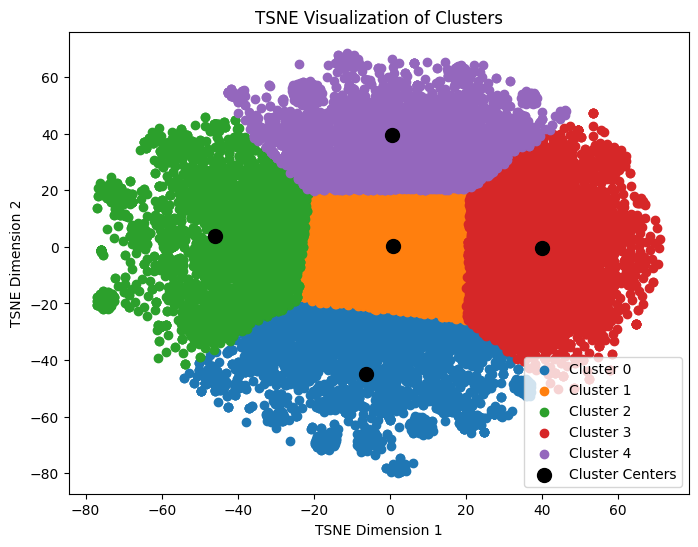

In [30]:

X_embedded_tf = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=40).fit_transform(data_tf_idf)
km_cls_tf = KMeans(n_clusters=5, random_state=42)
km_cls_tf.fit(X_embedded_tf)

silhouette_avg = silhouette_score(X_embedded_tf, km_cls_tf.labels_)
print(f'Silhouette Score: {silhouette_avg}')

plt.figure(figsize=(8, 6))

for i in range(len(set(km_cls_tf.labels_))):
    plt.scatter(X_embedded_tf[km_cls_tf.labels_ == i, 0], X_embedded_tf[km_cls_tf.labels_ == i, 1], label=f'Cluster {i}')

plt.scatter(km_cls_tf.cluster_centers_[:, 0], km_cls_tf.cluster_centers_[:, 1], s=100, c='black', label='Cluster Centers')

plt.title('TSNE Visualization of Clusters')
plt.xlabel('TSNE Dimension 1')
plt.ylabel('TSNE Dimension 2')
plt.legend()
plt.show()

#clustering using BOW

In [31]:
def data_bow(data):
    data = data.fillna('')
    coun_vect = CountVectorizer()
    BOW_vectors = coun_vect.fit_transform(data)
    count_array = BOW_vectors.toarray()
    df_bow = pd.DataFrame(count_array,columns = coun_vect.get_feature_names_out())
    return df_bow

In [32]:
data_bow =data_bow(X)
data_bow

,___,_any,_broker_,aaa,aal,aap,aapd,aapl,aaple,aaplq,aapu,aave,abandon,abb,abbot,abbott,abbreviation,abbv,abbvie,abcl,abdulrahman,aber,abev,ability,able,abmd,abnb,abortion,above,abr,absent,absolute,absolutely,absorb,absorbed,absurd,absurdity,absurdly,abt,abundance,abuse,abusing,academia,academy,acb,acc,accelerate,accelerates,acceleration,accentuates,accept,acceptable,acceptance,accepted,access,accessory,accident,accidentally,acciones,accommodation,accomplish,accord,accordingly,account,accountable,accounting,accretion,accretive,acct,accts,accumulate,accumulation,accuracy,accurate,accuse,accuses,ace,achieve,achievement,ackage,ackamn,ackman,ackmann,ackmans,acknowledge,acknowledgment,acls,acmr,acn,aco,acolyte,acq,acquirable,acquire,acquirer,acquires,acquisiiton,acquisition,acr,acronym,across,act,action,activate,activation,active,actively,activision,activist,activity,actor,actual,actualizado,actually,acwi,ad,ada,adage,adam,adamslivers,adani,adapt,adbe,adc,add,addessable,addict,addiction,addictive,adding,addition,additional,additionally,address,addressable,addtl,addyy,adequately,adhesive,adj,adjacent,adjst,adjust,adjusted,adjustment,adjusts,adler,adm,administration,admins,admire,admirer,admission,admit,admits,admittedly,adobe,adopt,adopter,adoption,adorable,adp,adr,adrs,adsk,adtech,adult,adv,advance,advanced,advancement,advantage,adverse,adversity,advert,advertised,advertisement,advertiser,advertising,advice,advise,adviser,advisor,advisory,advocate,adwords,adx,adyen,adyey,aem,aer,aerc,aerospace,aese,afaic,afaik,affair,affect,affected,affiliate,affinity,affirm,affirmation,affluent,afford,affordable,afghanistan,afifa,afl,aflac,afraid,africa,afrm,aft,after,afterhours,aftermarket,afternoon,aftershock,afterwards,ag,agc,agde,age,agency,agenda,ager,agg,agger,aggregate,aggregation,aggregator,aggressive,aggressively,agi,agl,agm,ago,agree,agreement,agrees,agriculture,ah,ahead,ahh,ahhh,ahold,ahs,ai,aid,aig,aily,aim,ain,aint,air,airbnb,aircraft,airdrop,airdropped,airline,airplane,airpod,airpods,airport,aka,akam,aladdin,alan,alarm,alarmed,alb,albt,album,alcanna,alchemyofsouls,alert,alexa,alexabliss,alexander,alexis,alfa,algn,algo,algoflow,algoflows,algorand,algorithm,algorithmic,algos,ali,alibaba,alicia,alicloud,alien,align,aligning,aligns,alike,alil,alive,all,allah,allege,allegedly,alleges,aller,alliance,alliancebernstein,allk,allo,allocate,allocation,allocator,allow,allowance,allows,alltimestamped,allure,ally,almost,alms,alone,along,alongside,alot,alpha,alphabet,alpine,alpp,alreadt,already,alrededor,alright,alsin,also,alt,altar,altarock,alternate,alternative,although,alto,altria,alu,aluminum,always,alzn,amaat,amador,amass,amat,amateur,amaz,amaze,amazin,amazn,amaznon,amazo,amazon,amazonhurts,amba,ambition,ambo,ambulance,amc,amcneverleaving,amcnotleaving,amcshortsqueeze,amcsqueeze,amcstock,amcstrong,amctheatres,amctothemoon,amcwelovethestock,amd,ameh,america,american,americold,ameritrade,amex,amgen,amgn,amid,amidst,amine,amkr,among,amongst,amortization,amortize,amortizes,amount,amp,ampg,ampl,amplifies,amplify,amr,amt,amtrack,amulet,amuse,amuses,amy,amza,amzl,amzn,amzon,an,analogue,analogy,analysis,analyst,analytics,analyze,analyzes,anatomy,anc,anchor,ancillary,anctf,and,anda,andrea,andreessen,android,andy,anecdotal,anemic,anemoi,anesthetic,anet,angel,angeles,anger,angle,angry,angst,angsty,anguish,animando,animate,animation,anime,anne,annex,annie,annihilate,annihilation,anniversary,annotate,announce,announced,announcement,announces,announcing,annoy,annual,annualised,annualized,annually,ano,anon,another,answer,answers,ant,antagonistic,antenna,anthony,anti,anticipate,anticipation,anticompetitive,antigravity,antitrust,antivax,antm,anvs,anxiety,anxious,anybody,anymore,anyone,anything,anytime,anyway,anyways,anywhere,aoc,aol,aos,aosl,apa,apac,apart,apartment,apd,ape,aperclip,apesnotleaving,apestogetherstrong,apex,api,aplenty,apocalypse,apocalyptic,apocolypse,apologize,apologizes,apology,app,apparatus,apparel,apparent,apparently,appeal,appear,appearance

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score: 0.37560850381851196


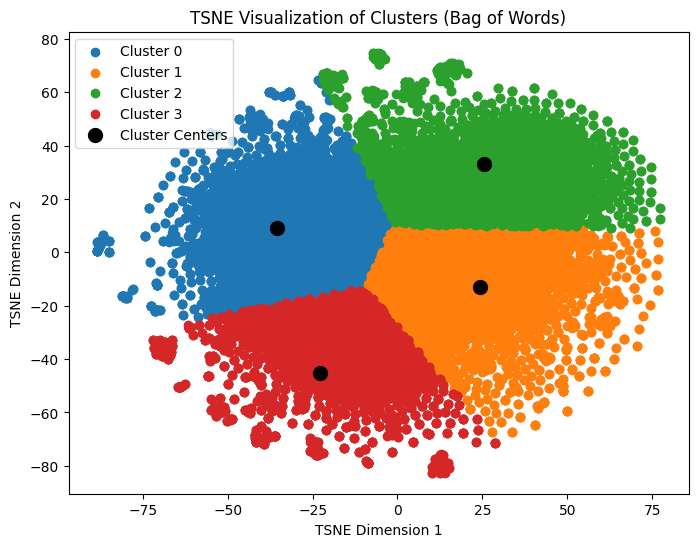

In [33]:


X_embedded_bow = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=40).fit_transform(data_bow)
km_cls_bow = KMeans(n_clusters=4, random_state=42)
km_cls_bow.fit(X_embedded_bow)

silhouette_avg = silhouette_score(X_embedded_bow, km_cls_bow.labels_)
print(f'Silhouette Score: {silhouette_avg}')

plt.figure(figsize=(8, 6))

for i in range(len(set(km_cls_bow.labels_))):
    plt.scatter(X_embedded_bow[km_cls_bow.labels_ == i, 0], X_embedded_bow[km_cls_bow.labels_ == i, 1], label=f'Cluster {i}')

plt.scatter(km_cls_bow.cluster_centers_[:, 0], km_cls_bow.cluster_centers_[:, 1], s=100, c='black', label='Cluster Centers')

plt.title('TSNE Visualization of Clusters (Bag of Words)')
plt.xlabel('TSNE Dimension 1')
plt.ylabel('TSNE Dimension 2')
plt.legend()
plt.show()


 hierarchical clustering for Tf_idf

In [34]:
from sklearn.manifold import TSNE
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

# Assuming data_tf_idf is your data
X_embedded_tf1 = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=40).fit_transform(data_tf_idf)

# Creating a dendrogram for visualization
dendrogram = sch.dendrogram(sch.linkage(X_embedded_tf1, method='ward'))

# Hierarchical clustering
hc_tf1 = AgglomerativeClustering(n_clusters=5, affinity='euclidean')
y_hc_tf1 = hc_tf1.fit_predict(X_embedded_tf1)
print("Hierarchical clustering:")
print(y_hc_tf1)

plt.show()


KeyboardInterrupt: ignored

In [ ]:
silhouette_avg = silhouette_score(X_embedded_tf1, y_hc_tf1)
print(f'Silhouette Score: {silhouette_avg}')

 hierarchical clustering for BOW

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

X_embedded_bow = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=40).fit_transform(data_bow)

dendrogram = sch.dendrogram(sch.linkage(X_embedded_bow, method='ward'))

hc_bow = AgglomerativeClustering(n_clusters=5, affinity='euclidean')
y_hc_bow = hc_bow.fit_predict(X_embedded_bow)
print("Hierarchical clustering:")
print(y_hc_bow)

plt.show()


In [ ]:
silhouette_avg = silhouette_score(X_embedded_bow, y_hc_bow)
print(f'Silhouette Score: {silhouette_avg}')

In [35]:
import nltk
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package basque_grammars is already up-to-date!
[nltk_data]    | Downloading package bcp47 to /root/nltk_data...
[nltk_data]    |   Package bcp47 is already up-to-dat

True

In [36]:
nltk.downloader.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [37]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import unicodedata

In [38]:
%%time
sentiment_analyzer = SentimentIntensityAnalyzer()
for indx, row in sent_df.T.iteritems():
    try:
        sentence_i = unicodedata.normalize('NFKD', sent_df.loc[indx, 'cleaned'])
        sentence_sentiment = sentiment_analyzer.polarity_scores(sentence_i)
        sent_df.at[indx, 'sentiment_score'] = sentence_sentiment['compound']
        sent_df.at[indx, 'Negative'] = sentence_sentiment['neg']
        sent_df.at[indx, 'Neutral'] = sentence_sentiment['neu']
        sent_df.at[indx, 'Positive'] = sentence_sentiment['pos']
    except TypeError:
        print (sent_df.loc[indx, 'cleaned'])
        print (indx)
        break

<timed exec>:2: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.


nan
1127
CPU times: user 746 ms, sys: 2.95 ms, total: 749 ms
Wall time: 776 ms


In [39]:
sent_df.head()

,Date,Tweet,Stock Name,Company Name,char_length,cleaned,sentiment_score,Negative,Neutral,Positive
0,2022-09-29 19:07:54+00:00,"*META ANNOUNCES HIRING FREEZE, WARNS EMPLOYEES OF RESTRUCTURING\n\n$META $FB https://t.co/7ndrg7yUjL",META,"Meta Platforms, Inc.",98,meta announces hire freeze warns employee restructuring meta,-0.0516,0.163,0.698,0.14
1,2022-09-25 14:34:16+00:00,Year-to-Date Performance:\n\n1. $FB: -59%\n2. $AAPL: -17%\n3. $AMZN: -33%\n4. $NFLX: -62%\n5. $GOOGL: -32%\n6. $TSLA: -31%\n7. $MSFT: -29%\n8. $DIS: -36%\n9. $NVDA: -58%\n10. $BABA: -35%\n11. $PYPL: -55%\n\nImagine the damage once housing prices crash next.\n\nThe bubble is officially bursting.,META,"Meta Platforms, Inc.",279,year-to-date performance aapl amzn nflx googl tsla msft dis nvda baba pypl imagine damage housing price crash next bubble officially bursting,-0.7096,0.237,0.763,0.0
2,2022-09-22 21:51:28+00:00,"Year-to-Date performance:\n\n1. $FB: -58%\n2. $AMZN: -31%\n3. $AAPL: -16%\n4. $NFLX: -60%\n5. $GOOGL: -31%\n6. $MSFT: -28%\n7. $TSLA: -28%\n8. $F: -41%\n9. $PYPL: -55%\n\nAll FAANG stocks, aside from $AAPL, are now in bear market territory.\n\nThe fact that $SPX isn’t down 30%+ is a miracle.",META,"Meta Platforms, Inc.",278,year-to-date performance amzn aapl nflx googl msft tsla pypl faang stock aside aapl bear market territory fact spx isn miracle,0.5859,0.0,0.833,0.167
3,2022-09-22 16:18:00+00:00,$EPAZ DeskFlex Metaverse Office Technology offers businesses an exciting way to merge the current environment of remote and in-person workplaces. #Meta $FB $MSFT $MTTR $ADBE $NVDA $U https://t.co/XiiqiLPP02,META,"Meta Platforms, Inc.",206,epaz deskflex metaverse office technology offer business excite way merge current environment remote in-person workplace meta msft mttr adbe nvda,0.4767,0.0,0.86,0.14
4,2022-09-22 07:15:57+00:00,⚠️BREAKING:\n\n*META STOCK CRASHES TO LOWEST LEVEL SINCE MARCH 2020\n\n$META $FB https://t.co/FpCpfpYPLH,META,"Meta Platforms, Inc.",100,warn break meta stock crash low level since march meta,-0.6369,0.47,0.53,0.0


In [40]:
def polarity(text):
    text = str(text)
    encoded_input = tokenizer(text, return_tensors='tf')
    output = model(encoded_input)
    scores = output[0][0].numpy()
    scores = softmax(scores)

    # Print labels and scores
    ranking = np.argsort(scores)
    ranking = ranking[::-1]
    l = config.id2label[ranking[0]]
    plrty = -1 if l == "Negative" else 1 if l == "Positive" else 0
    s = np.round(float(scores[ranking[0]]), 4)
    return (l,plrty)


In [41]:
sent_df['label'], sent_df['Polarity'] = zip(*sent_df['cleaned'].apply(lambda txt: polarity(txt)))
sent_df.to_csv("polarizedTweets.csv", index=False)


3) Preparing Data for time series model


In [42]:
label_to_polarity = {
    'negative': -1,
    'positive': 1,
    'neutral': 0
}

# Use the `map()` function to apply the mapping and update the 'Polarity' column
sent_df['Polarity'] = sent_df['label'].map(label_to_polarity)

# Save the DataFrame to CSV if needed

sent_df.to_csv("polarizedTweets.csv", index=False)

In [43]:
ptweets = pd.read_csv("polarizedTweets.csv")
ptweets.head()

,Date,Tweet,Stock Name,Company Name,char_length,cleaned,sentiment_score,Negative,Neutral,Positive,label,Polarity
0,2022-09-29 19:07:54+00:00,"*META ANNOUNCES HIRING FREEZE, WARNS EMPLOYEES OF RESTRUCTURING\n\n$META $FB https://t.co/7ndrg7yUjL",META,"Meta Platforms, Inc.",98,meta announces hire freeze warns employee restructuring meta,-0.0516,0.163,0.698,0.140,neutral,0
1,2022-09-25 14:34:16+00:00,Year-to-Date Performance:\n\n1. $FB: -59%\n2. $AAPL: -17%\n3. $AMZN: -33%\n4. $NFLX: -62%\n5. $GOOGL: -32%\n6. $TSLA: -31%\n7. $MSFT: -29%\n8. $DIS: -36%\n9. $NVDA: -58%\n10. $BABA: -35%\n11. $PYPL: -55%\n\nImagine the damage once housing prices crash next.\n\nThe bubble is officially bursting.,META,"Meta Platforms, Inc.",279,year-to-date performance aapl amzn nflx googl tsla msft dis nvda baba pypl imagine damage housing price crash next bubble officially bursting,-0.7096,0.237,0.763,0.000,negative,-1
2,2022-09-22 21:51:28+00:00,"Year-to-Date performance:\n\n1. $FB: -58%\n2. $AMZN: -31%\n3. $AAPL: -16%\n4. $NFLX: -60%\n5. $GOOGL: -31%\n6. $MSFT: -28%\n7. $TSLA: -28%\n8. $F: -41%\n9. $PYPL: -55%\n\nAll FAANG stocks, aside from $AAPL, are now in bear market territory.\n\nThe fact that $SPX isn’t down 30%+ is a miracle.",META,"Meta Platforms, Inc.",278,year-to-date performance amzn aapl nflx googl msft tsla pypl faang stock aside aapl bear market territory fact spx isn miracle,0.5859,0.000,0.833,0.167,neutral,0
3,2022-09-22 16:18:00+00:00,$EPAZ DeskFlex Metaverse Office Technology offers businesses an exciting way to merge the current environment of remote and in-person workplaces. #Meta $FB $MSFT $MTTR $ADBE $NVDA $U https://t.co/XiiqiLPP02,META,"Meta Platforms, Inc.",206,epaz deskflex metaverse office technology offer business excite way merge current environment remote in-person workplace meta msft mttr adbe nvda,0.4767,0.000,0.860,0.140,neutral,0
4,2022-09-22 07:15:57+00:00,⚠️BREAKING:\n\n*META STOCK CRASHES TO LOWEST LEVEL SINCE MARCH 2020\n\n$META $FB https://t.co/FpCpfpYPLH,META,"Meta Platforms, Inc.",100,warn break meta stock crash low level since march meta,-0.6369,0.470,0.530,0.000,negative,-1


In [44]:
ptweets_df = ptweets.loc[:,["Date","sentiment_score","Polarity", "Stock Name"]]
ptweets_df.head()

,Date,sentiment_score,Polarity,Stock Name
0,2022-09-29 19:07:54+00:00,-0.0516,0,META
1,2022-09-25 14:34:16+00:00,-0.7096,-1,META
2,2022-09-22 21:51:28+00:00,0.5859,0,META
3,2022-09-22 16:18:00+00:00,0.4767,0,META
4,2022-09-22 07:15:57+00:00,-0.6369,-1,META


In [45]:
# Change the date format to match with the next CSV file date format
ptweets_df['Date'] = pd.to_datetime(ptweets_df['Date'], infer_datetime_format=True)
ptweets_df['Date'] = pd.to_datetime(ptweets_df['Date'].dt.strftime("%m/%d/%y"))

# Aggregate the tweets polarization by average, sum, and counts by 'Date' and 'Stock Name'
Pol_df = pd.DataFrame(ptweets_df.groupby(['Date', 'Stock Name'])['Polarity'].mean())
Pol_df.rename(columns={"Polarity": "P_mean"}, inplace=True)
Pol_df['P_sum'] = ptweets_df.groupby(['Date', 'Stock Name'])['Polarity'].sum()
Pol_df['twt_count'] = ptweets_df.groupby(['Date', 'Stock Name'])['Polarity'].count()
Pol_df.reset_index(inplace=True)  # Reset the index to get 'Date' and 'Stock Name' as columns
Pol_df.head(20)


,Date,Stock Name,P_mean,P_sum,twt_count
0,2021-09-30,AAPL,-0.571429,-4,7
1,2021-09-30,AMZN,0.200000,1,5
2,2021-09-30,GOOG,1.000000,1,1
3,2021-09-30,META,0.000000,0,3
4,2021-09-30,NFLX,-0.200000,-1,5
5,2021-10-01,AAPL,0.000000,0,11
6,2021-10-01,AMZN,-0.125000,-1,8
7,2021-10-01,GOOG,0.000000,0,2
8,2021-10-01,META,0.000000,0,11
9,2021-10-01,NFLX,0.400000,2,5


In [46]:
Pol_df['Stock Name'].unique()

array(['AAPL', 'AMZN', 'GOOG', 'META', 'NFLX'], dtype=object)

In [47]:
stockdata_df = pd.read_csv('stock_yfinance_data.csv')
stockdata_df

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name
0,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA
1,2021-10-01,259.466675,260.260010,254.529999,258.406677,258.406677,51094200,TSLA
2,2021-10-04,265.500000,268.989990,258.706665,260.510010,260.510010,91449900,TSLA
3,2021-10-05,261.600006,265.769989,258.066681,260.196655,260.196655,55297800,TSLA
4,2021-10-06,258.733337,262.220001,257.739990,260.916656,260.916656,43898400,TSLA
...,...,...,...,...,...,...,...,...
6295,2022-09-23,13.090000,13.892000,12.860000,13.710000,13.710000,28279600,XPEV
6296,2022-09-26,14.280000,14.830000,14.070000,14.370000,14.370000,27891300,XPEV
6297,2022-09-27,14.580000,14.800000,13.580000,13.710000,13.710000,21160800,XPEV
6298,2022-09-28,13.050000,13.421000,12.690000,13.330000,13.330000,31799400,XPEV


In [48]:
stockdata_df['Stock Name'].unique()

array(['TSLA', 'MSFT', 'PG', 'META', 'AMZN', 'GOOG', 'AMD', 'AAPL',
       'NFLX', 'TSM', 'KO', 'F', 'COST', 'DIS', 'VZ', 'CRM', 'INTC', 'BA',
       'BX', 'NOC', 'PYPL', 'ENPH', 'NIO', 'ZS', 'XPEV'], dtype=object)

In [49]:
selected_tickers = ['AAPL', 'AMZN', 'META', 'GOOG', 'NFLX']
stockdata_df = stockdata_df[stockdata_df['Stock Name'].isin(selected_tickers)]

In [50]:
stockdata_df['Stock Name'].unique()

array(['META', 'AMZN', 'GOOG', 'AAPL', 'NFLX'], dtype=object)

In [51]:
stockdata_df['Date'].unique()

array(['2021-09-30', '2021-10-01', '2021-10-04', '2021-10-05',
       '2021-10-06', '2021-10-07', '2021-10-08', '2021-10-11',
       '2021-10-12', '2021-10-13', '2021-10-14', '2021-10-15',
       '2021-10-18', '2021-10-19', '2021-10-20', '2021-10-21',
       '2021-10-22', '2021-10-25', '2021-10-26', '2021-10-27',
       '2021-10-28', '2021-10-29', '2021-11-01', '2021-11-02',
       '2021-11-03', '2021-11-04', '2021-11-05', '2021-11-08',
       '2021-11-09', '2021-11-10', '2021-11-11', '2021-11-12',
       '2021-11-15', '2021-11-16', '2021-11-17', '2021-11-18',
       '2021-11-19', '2021-11-22', '2021-11-23', '2021-11-24',
       '2021-11-26', '2021-11-29', '2021-11-30', '2021-12-01',
       '2021-12-02', '2021-12-03', '2021-12-06', '2021-12-07',
       '2021-12-08', '2021-12-09', '2021-12-10', '2021-12-13',
       '2021-12-14', '2021-12-15', '2021-12-16', '2021-12-17',
       '2021-12-20', '2021-12-21', '2021-12-22', '2021-12-23',
       '2021-12-27', '2021-12-28', '2021-12-29', '2021-

In [52]:
# merged_df = stockdata_df.merge(Pol_df, on=['Stock Name', 'Date'])
# merged_df

# Convert the "Date" column in both DataFrames to datetime64[ns] data type
stockdata_df['Date'] = pd.to_datetime(stockdata_df['Date'])
Pol_df['Date'] = pd.to_datetime(Pol_df['Date'])

# Merge the DataFrames on ['Stock Name', 'Date']
merged_df = stockdata_df.merge(Pol_df, on=['Stock Name', 'Date'])

# Now you should have the merged DataFrame without any error
merged_df


<ipython-input-52-8d0d0e6ae235>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stockdata_df['Date'] = pd.to_datetime(stockdata_df['Date'])


,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name,P_mean,P_sum,twt_count
0,2021-09-30,340.450012,342.799988,338.149994,339.390015,339.390015,16547100,META,0.000000,0,3
1,2021-10-01,341.609985,345.019989,338.640015,343.010010,343.010010,14905300,META,0.000000,0,11
2,2021-10-04,335.529999,335.940002,322.700012,326.230011,326.230011,42885000,META,-0.406250,-26,64
3,2021-10-05,328.579987,335.179993,326.160004,332.959991,332.959991,35377900,META,-0.483871,-15,31
4,2021-10-06,329.739990,334.380005,325.799988,333.640015,333.640015,26443000,META,-0.166667,-2,12
...,...,...,...,...,...,...,...,...,...,...,...
1184,2022-09-22,235.350006,240.500000,231.660004,237.050003,237.050003,10018000,NFLX,0.000000,0,2
1185,2022-09-23,235.139999,236.449997,221.429993,226.410004,226.410004,11207200,NFLX,1.000000,1,1
1186,2022-09-26,225.600006,232.699997,223.009995,224.070007,224.070007,8234300,NFLX,0.000000,0,3
1187,2022-09-28,229.690002,246.649994,227.380005,245.199997,245.199997,17579700,NFLX,-0.500000,-2,4


In [53]:
merged_df.to_csv("merged_data.csv", index=False)

In [54]:


import numpy as np
import tensorflow as tf
from keras.callbacks import ModelCheckpoint
from keras.models import Sequential
from keras.layers import LSTM,Conv1D,Conv2D,MaxPooling2D,MaxPooling1D,Flatten
from keras.layers import Dense, Dropout
import pandas as pd
from keras.optimizers import Adam
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler,MinMaxScaler
import seaborn as sns
#from datetime import datetime

from tensorflow.compat.v1.keras.layers import CuDNNLSTM,Bidirectional
seed=42



In [55]:
#Read the csv file
df = pd.read_csv('merged_data.csv')

In [56]:
df['Date'] = pd.to_datetime(df['Date'])
df

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name,P_mean,P_sum,twt_count
0,2021-09-30,340.450012,342.799988,338.149994,339.390015,339.390015,16547100,META,0.000000,0,3
1,2021-10-01,341.609985,345.019989,338.640015,343.010010,343.010010,14905300,META,0.000000,0,11
2,2021-10-04,335.529999,335.940002,322.700012,326.230011,326.230011,42885000,META,-0.406250,-26,64
3,2021-10-05,328.579987,335.179993,326.160004,332.959991,332.959991,35377900,META,-0.483871,-15,31
4,2021-10-06,329.739990,334.380005,325.799988,333.640015,333.640015,26443000,META,-0.166667,-2,12
...,...,...,...,...,...,...,...,...,...,...,...
1184,2022-09-22,235.350006,240.500000,231.660004,237.050003,237.050003,10018000,NFLX,0.000000,0,2
1185,2022-09-23,235.139999,236.449997,221.429993,226.410004,226.410004,11207200,NFLX,1.000000,1,1
1186,2022-09-26,225.600006,232.699997,223.009995,224.070007,224.070007,8234300,NFLX,0.000000,0,3
1187,2022-09-28,229.690002,246.649994,227.380005,245.199997,245.199997,17579700,NFLX,-0.500000,-2,4


In [57]:
df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'Stock Name', 'P_mean', 'P_sum', 'twt_count'],
      dtype='object')

<ipython-input-58-350995869d48>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_df['sentiment_analysis'] = company_df['P_mean']
<ipython-input-58-350995869d48>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_df['sentiment_analysis'] = company_df['sentiment_analysis'].apply(lambda x: 'pos' if x > 0 else 'nue' if x == 0 else 'neg')


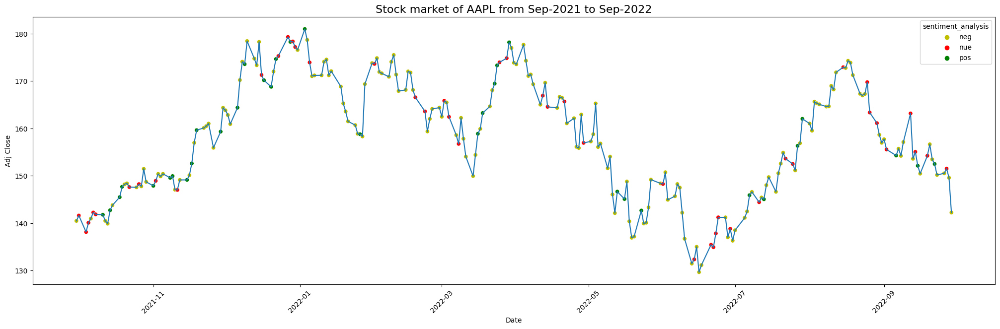

<ipython-input-58-350995869d48>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_df['sentiment_analysis'] = company_df['P_mean']
<ipython-input-58-350995869d48>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_df['sentiment_analysis'] = company_df['sentiment_analysis'].apply(lambda x: 'pos' if x > 0 else 'nue' if x == 0 else 'neg')


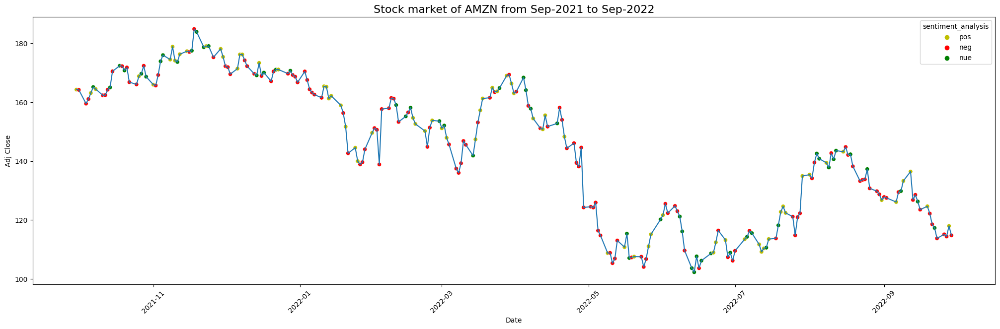

<ipython-input-58-350995869d48>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_df['sentiment_analysis'] = company_df['P_mean']
<ipython-input-58-350995869d48>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_df['sentiment_analysis'] = company_df['sentiment_analysis'].apply(lambda x: 'pos' if x > 0 else 'nue' if x == 0 else 'neg')


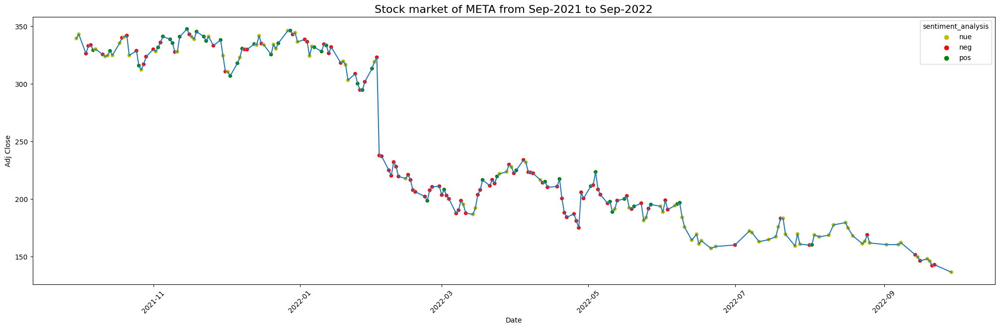

<ipython-input-58-350995869d48>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_df['sentiment_analysis'] = company_df['P_mean']
<ipython-input-58-350995869d48>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_df['sentiment_analysis'] = company_df['sentiment_analysis'].apply(lambda x: 'pos' if x > 0 else 'nue' if x == 0 else 'neg')


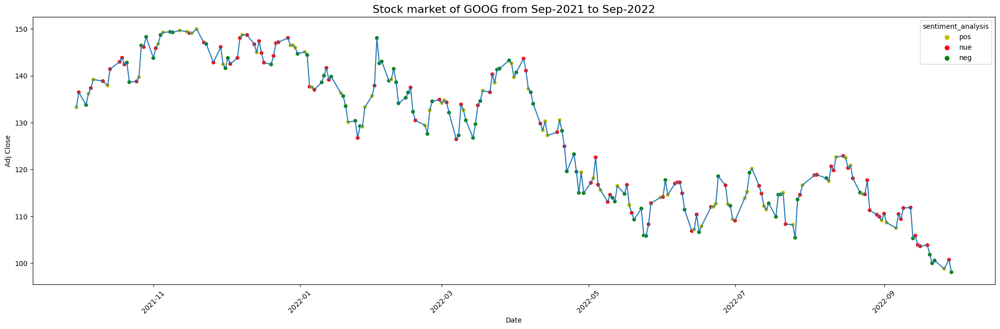

<ipython-input-58-350995869d48>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_df['sentiment_analysis'] = company_df['P_mean']
<ipython-input-58-350995869d48>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_df['sentiment_analysis'] = company_df['sentiment_analysis'].apply(lambda x: 'pos' if x > 0 else 'nue' if x == 0 else 'neg')


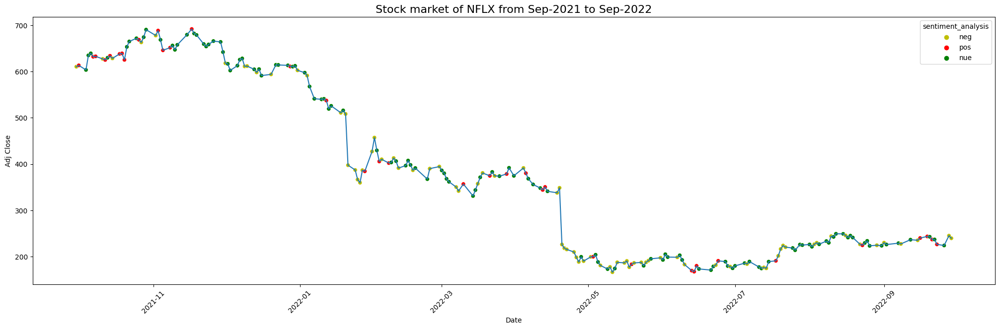

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a list of selected company names
selected_companies = ['AAPL', 'AMZN', 'META', 'GOOG', 'NFLX']

for company in selected_companies:
    plt.figure(figsize=(25, 7))

    company_df = merged_df[merged_df['Stock Name'] == company]

    sns.lineplot(x=company_df["Date"], y=company_df["Adj Close"])

    company_df['sentiment_analysis'] = company_df['P_mean']
    company_df['sentiment_analysis'] = company_df['sentiment_analysis'].apply(lambda x: 'pos' if x > 0 else 'nue' if x == 0 else 'neg')

    sns.scatterplot(x=company_df["Date"], y=company_df['Adj Close'], hue=company_df['sentiment_analysis'], palette=['y', 'r', 'g'])

    plt.xticks(rotation=45)
    plt.title(f"Stock market of {company} from Sep-2021 to Sep-2022", fontsize=16)

    plt.show()


In [63]:
train_dates = pd.to_datetime(df['Date'])
# print(train_dates.tail(15)) #Check last few dates.

#Variables for training
cols = [

    'Open',
    'High', 'Low',
    'Close',
    'Volume',
    'Adj Close',
    'P_mean',
        ]
#Date and volume columns are not used in training.
print(cols)

#New dataframe with only training data - 5 columns
df_for_training = df[cols].astype(float)
df_for_training.index=df['Date']
df_for_training

['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close', 'P_mean']


,Open,High,Low,Close,Volume,Adj Close,P_mean
Date,,,,,,,
2021-09-30,340.450012,342.799988,338.149994,339.390015,16547100.0,339.390015,0.000000
2021-10-01,341.609985,345.019989,338.640015,343.010010,14905300.0,343.010010,0.000000
2021-10-04,335.529999,335.940002,322.700012,326.230011,42885000.0,326.230011,-0.406250
2021-10-05,328.579987,335.179993,326.160004,332.959991,35377900.0,332.959991,-0.483871
2021-10-06,329.739990,334.380005,325.799988,333.640015,26443000.0,333.640015,-0.166667
...,...,...,...,...,...,...,...
2022-09-22,235.350006,240.500000,231.660004,237.050003,10018000.0,237.050003,0.000000
2022-09-23,235.139999,236.449997,221.429993,226.410004,11207200.0,226.410004,1.000000
2022-09-26,225.600006,232.699997,223.009995,224.070007,8234300.0,224.070007,0.000000



LSTM Model
Data scaling for LSTM because uses sigmoid and tanh that are sensitive to magnitude

In [64]:
scaler = MinMaxScaler()
scaler = scaler.fit(df_for_training)
df_for_training_scaled = scaler.transform(df_for_training)

scaler_for_inference = MinMaxScaler()
scaler_for_inference.fit_transform(df_for_training.loc[:,['Open','Adj Close']])

df_for_training_scaled
# df_for_training_scaled=df_for_training.copy()
# df_for_training_scaled=df_for_training_scaled.to_numpy()

array([[0.40790474, 0.40469343, 0.40984104, ..., 0.05623182, 0.40650272,
        0.5       ],
       [0.40985647, 0.40838304, 0.41067219, ..., 0.05018189, 0.4126011 ,
        0.5       ],
       [0.39962649, 0.39329223, 0.38363554, ..., 0.15328542, 0.3843329 ,
        0.296875  ],
       ...,
       [0.21466191, 0.22170885, 0.21454618, ..., 0.02559965, 0.21223047,
        0.5       ],
       [0.2215436 , 0.24489354, 0.22195838, ..., 0.06003689, 0.24782682,
        0.25      ],
       [0.2415998 , 0.245442  , 0.23603641, ..., 0.06525182, 0.23857818,
        0.16666667]])


As required for LSTM networks, we require to reshape an input data into n_samples x timesteps x n_features.

In [65]:


#Empty lists to be populated using formatted training data
trainX = []
trainY = []

n_future = 1   # Number of days we want to look into the future based on the past days.
n_past = 5  # Number of past days we want to use to predict the future.

#Reformat input data into a shape: (n_samples x timesteps x n_features)
#In my example, my df_for_training_scaled has a shape (12823, 5)
#12823 refers to the number of data points and 5 refers to the columns (multi-variables).
for i in range(n_past, len(df_for_training_scaled) - n_future +1):
    trainX.append(df_for_training_scaled[i - n_past:i, 0:df_for_training.shape[1]])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future,[0,-2]])

trainX, trainY = np.array(trainX), np.array(trainY)

print('TrainX shape = {}.'.format(trainX.shape))
print('TrainY shape = {}.'.format(trainY.shape))



TrainX shape = (1184, 5, 7).
TrainY shape = (1184, 1, 2).



Train test split for LSTM


In [66]:
from sklearn.model_selection import train_test_split

X_train_lstm_without_twitter, X_test_lstm_without_twitter, y_train_lstm_without_twitter, y_test_lstm_without_twitter = train_test_split(trainX[:,:,:-1], trainY, test_size=0.2, shuffle=False)

X_train_lstm_twitter, X_test_lstm_twitter, y_train_lstm_twitter, y_test_lstm_twitter = train_test_split(trainX, trainY, test_size=0.2, shuffle=False)

X_train_lstm_without_twitter.shape,X_train_lstm_twitter.shape

((947, 5, 6), (947, 5, 7))


Train validation split for LSTM


In [67]:
from sklearn.model_selection import train_test_split

X_train_lstm_without_twitter, X_val_lstm_without_twitter, y_train_lstm_without_twitter, y_val_lstm_without_twitter = train_test_split(X_train_lstm_without_twitter, y_train_lstm_without_twitter, test_size=0.1, shuffle=False)

X_train_lstm_twitter, X_val_lstm_twitter, y_train_lstm_twitter, y_val_lstm_twitter = train_test_split(X_train_lstm_twitter, y_train_lstm_twitter, test_size=0.1, shuffle=False)

X_train_lstm_without_twitter.shape,X_train_lstm_twitter.shape

((852, 5, 6), (852, 5, 7))


Model architecture


In [68]:
def build_model(input_shape):
    tf.random.set_seed(seed)
    cnn_lstm_model = Sequential()

    cnn_lstm_model.add(Conv1D(filters=128, kernel_size=2, strides=1, padding='valid', input_shape=input_shape))
    cnn_lstm_model.add(MaxPooling1D(pool_size=2, strides=2))

    cnn_lstm_model.add(Conv1D(filters=64, kernel_size=2, strides=1, padding='valid'))
    cnn_lstm_model.add(MaxPooling1D(pool_size=1, strides=2))
    # cnn_lstm_model.add(MaxPooling1D(pool_size=1, strides=2))

    cnn_lstm_model.add(Bidirectional(CuDNNLSTM(256, return_sequences=True)))
    cnn_lstm_model.add(Dropout(0.2))
    cnn_lstm_model.add(Bidirectional(CuDNNLSTM(256, return_sequences=True)))
    cnn_lstm_model.add(Dropout(0.2))

    cnn_lstm_model.add(Dense(32, activation='relu'))


    cnn_lstm_model.add(Dense(trainY.shape[2], activation='relu'))

    # cnn_lstm_model.build(input_shape=(trainX.shape[0], trainX.shape[1], trainX.shape[2]))

    cnn_lstm_model.compile(optimizer='adam', loss='mse')
    cnn_lstm_model.summary()
    return cnn_lstm_model

In [69]:
# fit the model

cnn_lstm_model_without_twitter=build_model((X_train_lstm_without_twitter.shape[1],X_train_lstm_without_twitter.shape[2]))
cnn_lstm_model_twitter=build_model((X_train_lstm_twitter.shape[1],X_train_lstm_twitter.shape[2]))

history_without_twitter = cnn_lstm_model_without_twitter.fit(X_train_lstm_without_twitter, y_train_lstm_without_twitter, epochs=50, batch_size=64, validation_data=(X_val_lstm_without_twitter, y_val_lstm_without_twitter), verbose=1, )


history_twitter = cnn_lstm_model_twitter.fit(X_train_lstm_twitter, y_train_lstm_twitter, epochs=50, batch_size=64, validation_data=(X_val_lstm_twitter, y_val_lstm_twitter), verbose=1, )

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4, 128)            1664      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 2, 128)           0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 1, 64)             16448     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1, 64)            0         
 1D)                                                             
                                                                 
 bidirectional (Bidirectiona  (None, 1, 512)           659456    
 l)                                                              
                                                        

## Plotting Training and validation loss

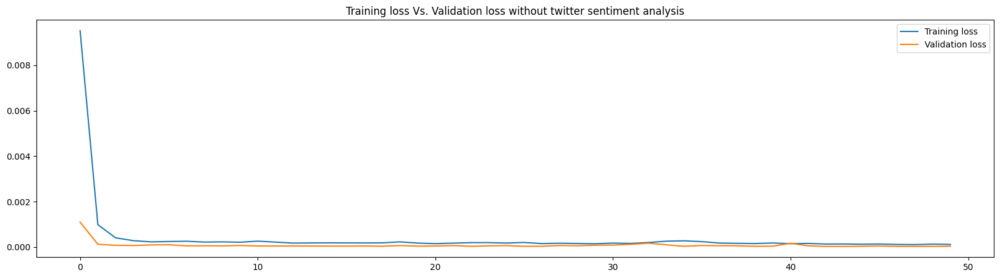

In [70]:
plt.figure(figsize=(20,5))
plt.plot(history_without_twitter.history['loss'], label='Training loss')
plt.plot(history_without_twitter.history['val_loss'], label='Validation loss')
plt.title('Training loss Vs. Validation loss without twitter sentiment analysis')
plt.legend()

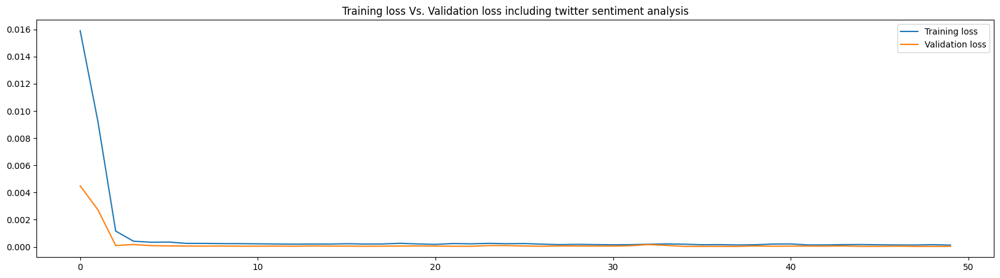

In [71]:
plt.figure(figsize=(20,5))
plt.plot(history_twitter.history['loss'], label='Training loss')
plt.plot(history_twitter.history['val_loss'], label='Validation loss')
plt.title('Training loss Vs. Validation loss including twitter sentiment analysis')
plt.legend()

## Ploting

In [62]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from math import sqrt

def plot_predictions_with_dates (type,twitter,dates,y_actual_lstm,y_pred_lstm):
    predicted_features=['Open','Adj Close']
    for i,predicted_feature in enumerate(predicted_features):
        plt.figure(figsize=(15,6))
        if twitter :
            plt.title(f'LSTM {type} prediction of {predicted_feature} feature After adding twitter sentiment analysis')
        else:
            plt.title(f'LSTM {type} prediction of {predicted_feature} feature without twitter sentiment analysis')
        sns.lineplot(x=dates, y=y_actual_lstm[:,i],label='Actual')
        sns.lineplot(x=dates, y=y_pred_lstm[:, i], label='Predicted')
        plt.show()
        error=mean_squared_error(y_actual_lstm[:,i], y_pred_lstm[:, i])
        print(f'Mean square error for {predicted_feature} ={error}')
    print('Total mean square error', mean_squared_error(y_actual_lstm, y_pred_lstm))

## Computing training accuracy

In [72]:
training_dates= df_for_training.index[:X_train_lstm_without_twitter.shape[0]]
#Make prediction
training_prediction_without_twitter = cnn_lstm_model_without_twitter.predict(X_train_lstm_without_twitter)

training_prediction_twitter = cnn_lstm_model_twitter.predict(X_train_lstm_twitter)

training_prediction_without_twitter=training_prediction_without_twitter.reshape(training_prediction_without_twitter.shape[0], training_prediction_without_twitter.shape[2])

training_prediction_twitter=training_prediction_twitter.reshape(training_prediction_twitter.shape[0], training_prediction_twitter.shape[2])

y_train_pred_lstm_without_twitter = scaler_for_inference.inverse_transform(training_prediction_without_twitter)

y_train_pred_lstm_twitter = scaler_for_inference.inverse_transform(training_prediction_twitter)

y_train_lstm_reshaped_without_twitter=y_train_lstm_without_twitter.reshape(y_train_lstm_without_twitter.shape[0], y_train_lstm_without_twitter.shape[2])

y_train_actual_lstm = scaler_for_inference.inverse_transform(y_train_lstm_reshaped_without_twitter)

27/27 [==============================] - 1s 4ms/step


## Training accuracy without twitter

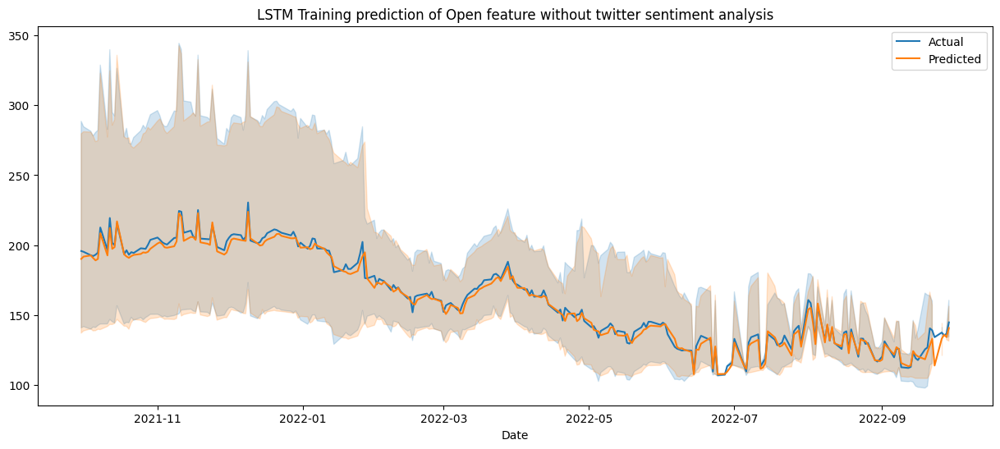

Mean square error for Open =27.399696629412517


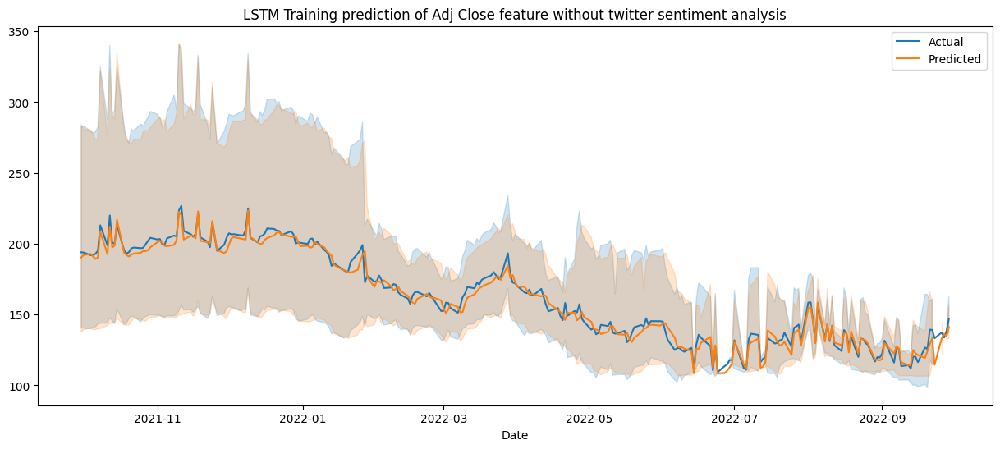

Mean square error for Adj Close =39.05616767950468
Total mean square error 33.22793215445859


In [73]:
plot_predictions_with_dates('Training',False,training_dates,y_train_actual_lstm,y_train_pred_lstm_without_twitter)


## Training accuracy after adding the impact of twitter sentiment analysis

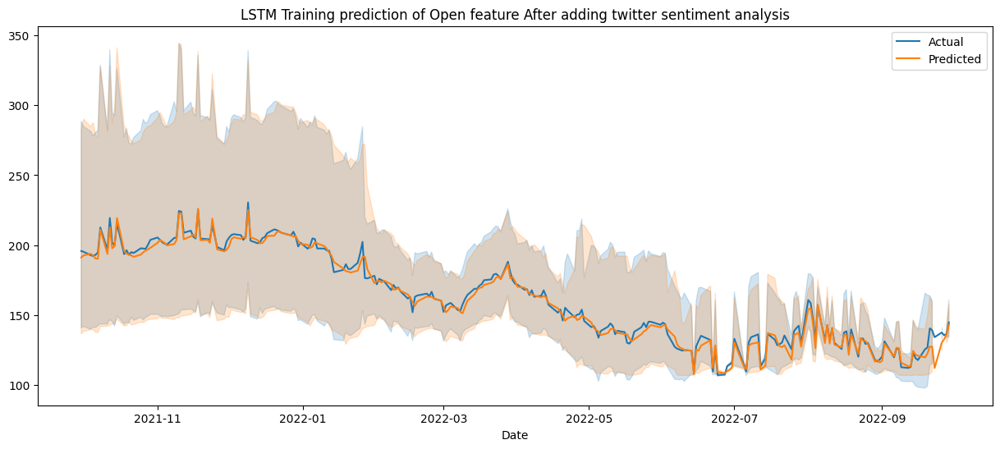

Mean square error for Open =30.465566929099932


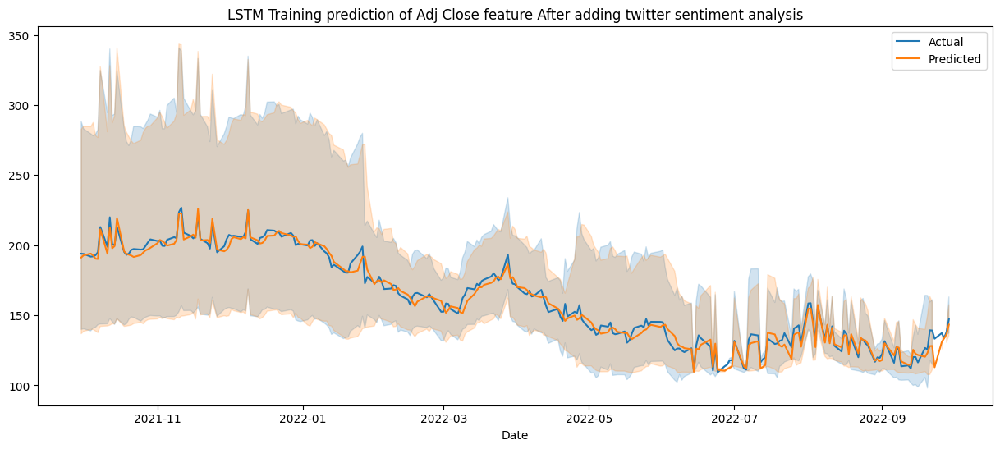

Mean square error for Adj Close =41.79017131567634
Total mean square error 36.12786912238813


In [74]:
plot_predictions_with_dates('Training',True,training_dates,y_train_actual_lstm,y_train_pred_lstm_twitter)

## Computing validation accuracy

In [75]:
validation_dates= df_for_training.index[X_train_lstm_without_twitter.shape[0]:X_train_lstm_without_twitter.shape[0] + X_val_lstm_without_twitter.shape[0]]
#Make prediction
validation_prediction_without_twitter = cnn_lstm_model_without_twitter.predict(X_val_lstm_without_twitter)

validation_prediction_twitter = cnn_lstm_model_twitter.predict(X_val_lstm_twitter)

validation_prediction_without_twitter=validation_prediction_without_twitter.reshape(validation_prediction_without_twitter.shape[0], validation_prediction_without_twitter.shape[2])


validation_prediction_twitter=validation_prediction_twitter.reshape(validation_prediction_twitter.shape[0], validation_prediction_twitter.shape[2])


y_val_pred_lstm_without_twitter = scaler_for_inference.inverse_transform(validation_prediction_without_twitter)
y_val_pred_lstm_twitter = scaler_for_inference.inverse_transform(validation_prediction_twitter)

y_val_actual_lstm_reshaped_without_twitter=y_val_lstm_without_twitter.reshape(y_val_lstm_without_twitter.shape[0], y_val_lstm_without_twitter.shape[2])
y_val_actual_lstm = scaler_for_inference.inverse_transform(y_val_actual_lstm_reshaped_without_twitter)

3/3 [==============================] - 0s 6ms/step


## Validation accuracy without twitter

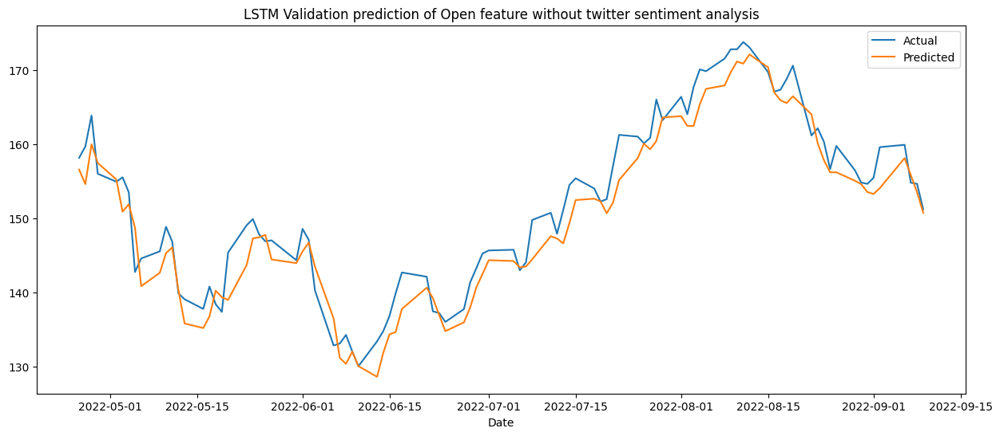

Mean square error for Open =8.98616360519571


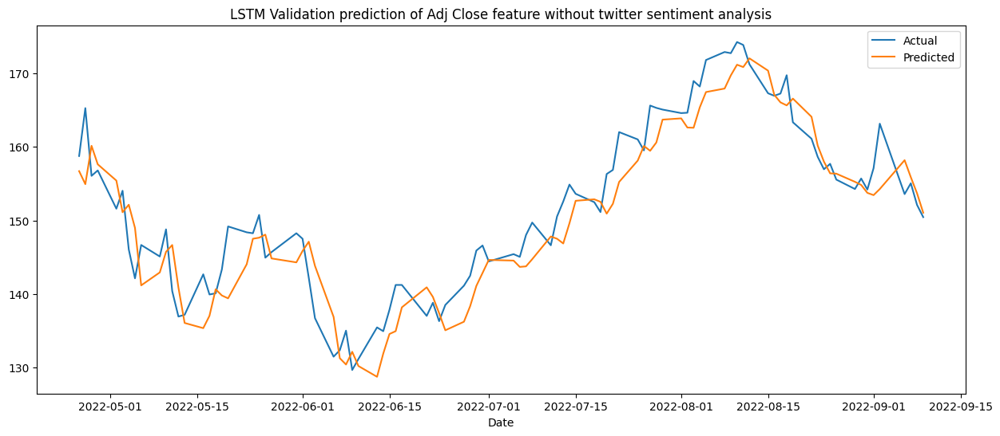

Mean square error for Adj Close =15.809537585841879
Total mean square error 12.397850595518793


In [76]:
plot_predictions_with_dates('Validation',False,validation_dates,y_val_actual_lstm,y_val_pred_lstm_without_twitter)

## Validation accuracy after adding the impact of twitter sentiment analysis

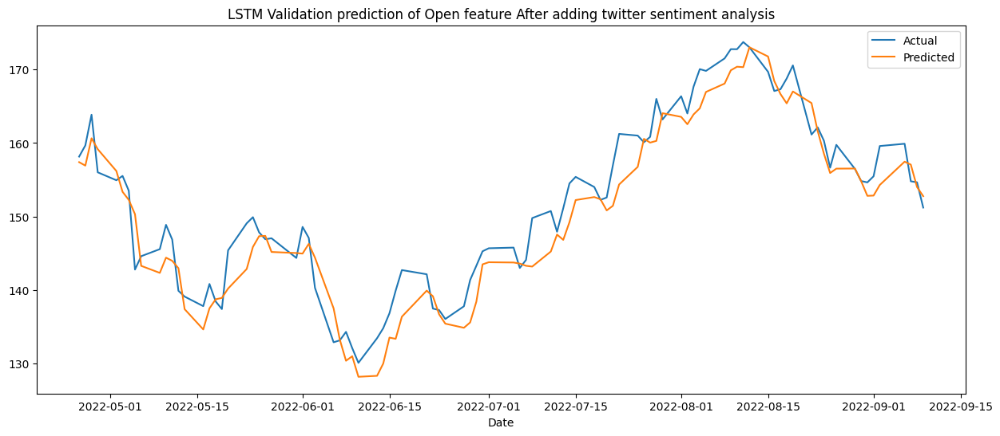

Mean square error for Open =10.933547377304512


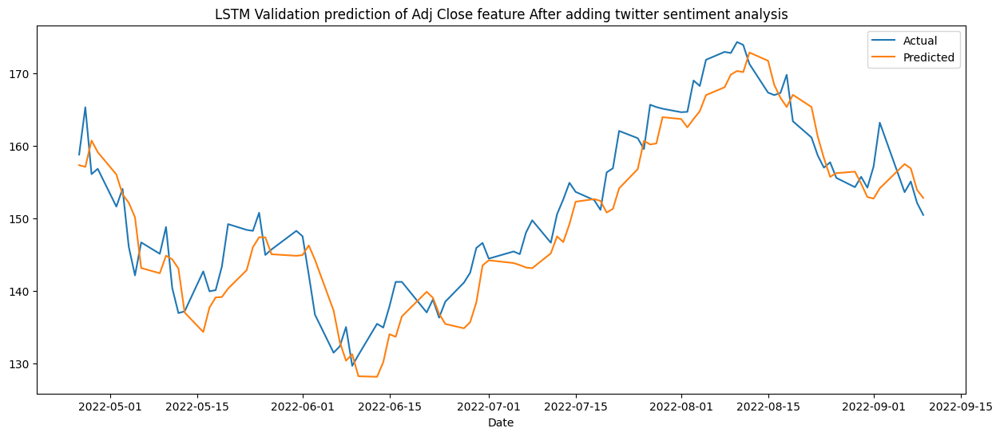

Mean square error for Adj Close =18.29574486108153
Total mean square error 14.614646119193022


In [77]:
plot_predictions_with_dates('Validation',True,validation_dates,y_val_actual_lstm,y_val_pred_lstm_twitter)

## Computing testing accuracy

In [78]:
testing_dates= df_for_training.index[-X_test_lstm_without_twitter.shape[0]:]
#Make prediction
testing_prediction_without_twitter = cnn_lstm_model_without_twitter.predict(X_test_lstm_without_twitter)
testing_prediction_twitter = cnn_lstm_model_twitter.predict(X_test_lstm_twitter)

testing_prediction_without_twitter=testing_prediction_without_twitter.reshape(testing_prediction_without_twitter.shape[0], testing_prediction_without_twitter.shape[2])
testing_prediction_twitter=testing_prediction_twitter.reshape(testing_prediction_twitter.shape[0], testing_prediction_twitter.shape[2])

y_test_pred_lstm_without_twitter = scaler_for_inference.inverse_transform(testing_prediction_without_twitter)
y_test_pred_lstm_twitter = scaler_for_inference.inverse_transform(testing_prediction_twitter)

y_test_actual_lstm_reshaped_without_twitter=y_test_lstm_without_twitter.reshape(y_test_lstm_without_twitter.shape[0], y_test_lstm_without_twitter.shape[2])


y_test_actual_lstm = scaler_for_inference.inverse_transform(y_test_actual_lstm_reshaped_without_twitter)


8/8 [==============================] - 0s 9ms/step


## Testing accuracy without twitter

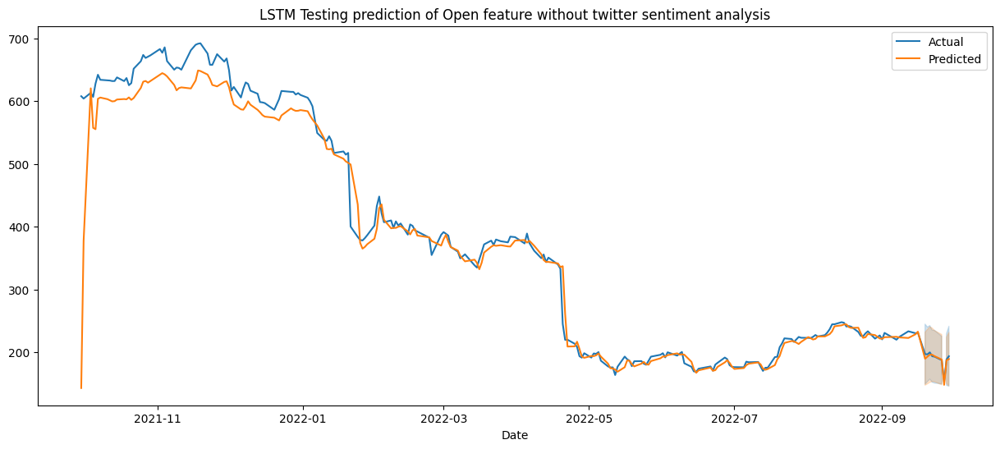

Mean square error for Open =1574.3677171606137


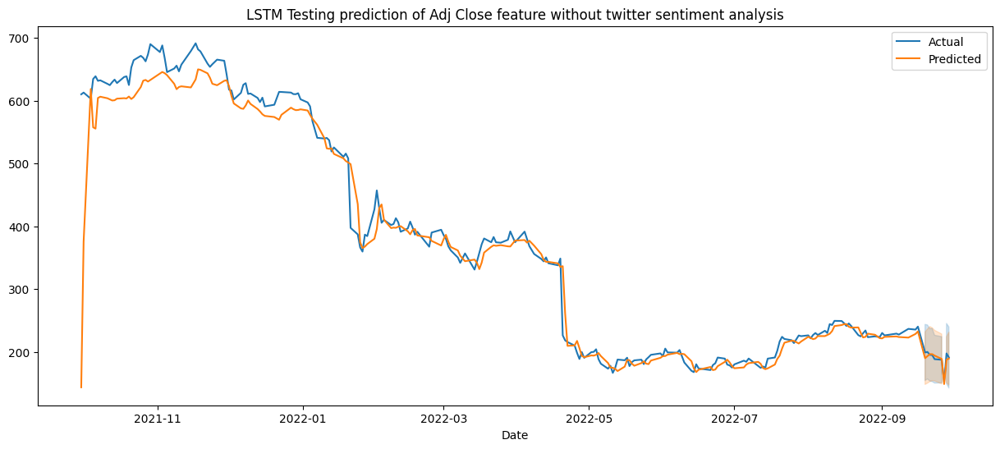

Mean square error for Adj Close =1660.7285045321642
Total mean square error 1617.548110846389


In [79]:
plot_predictions_with_dates('Testing',False,testing_dates,y_test_actual_lstm,y_test_pred_lstm_without_twitter)

## Testing accuracy after adding the impact of twitter sentiment analysis

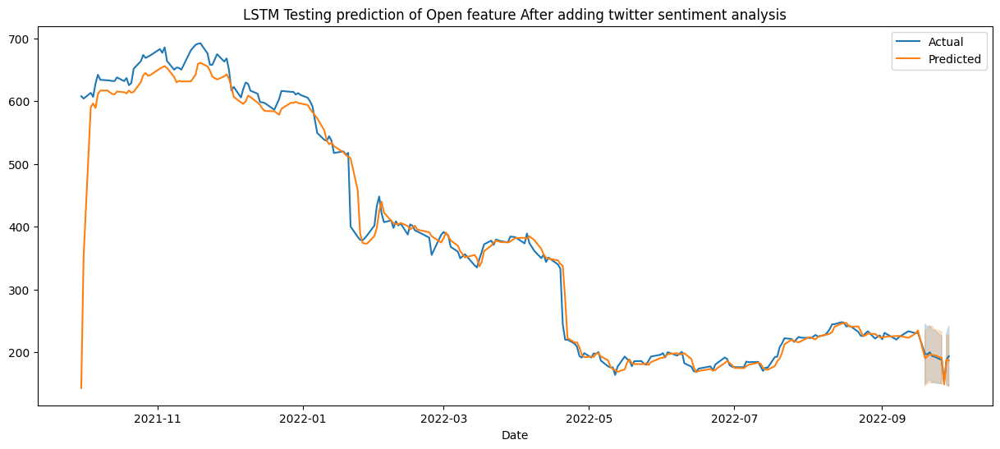

Mean square error for Open =1498.3272133947153


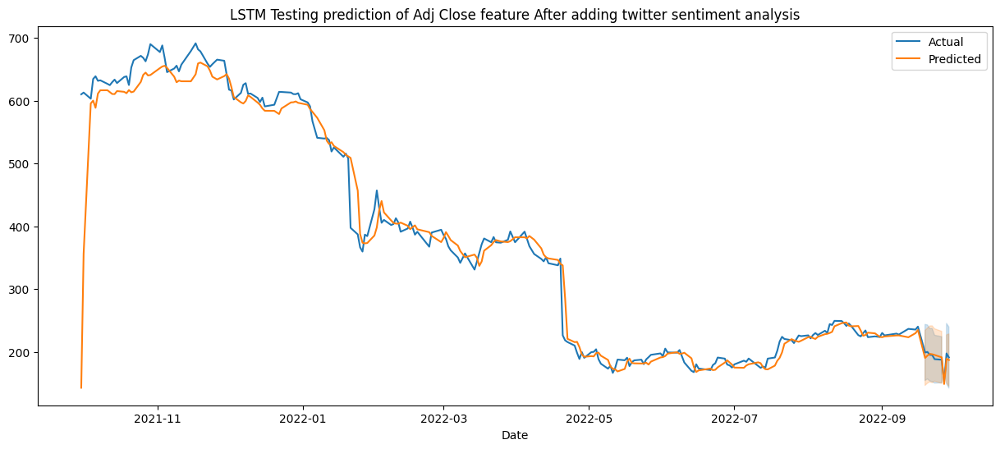

Mean square error for Adj Close =1599.6827215838437
Total mean square error 1549.0049674892794


In [80]:
plot_predictions_with_dates('Testing',True,testing_dates,y_test_actual_lstm,y_test_pred_lstm_twitter)

#ARIMA

In [81]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 25.0 MB/s eta 0:00:00


#Train test split for Arima


In [82]:
df_arima=df_for_training.copy()
# df_arima['Volume']=df['Volume']
n_past_for_arima=1
adj_close_feature=df_arima['Adj Close']
open_feature=df_arima['Open']
df_arima['Adj Close']=df_arima['Adj Close'].shift(-n_past_for_arima)
df_arima['Open']=df_arima['Open'].shift(-n_past_for_arima)
df_arima.dropna(inplace=True)
df_arima['Adj Close_feature']=adj_close_feature.iloc[:-1]
df_arima['open_feature_feature']=open_feature.iloc[:-1]
# df_arima=df_arima.reindex(columns=['open_lag','High', 'Low', 'Close', 'adj_close_lag','P_mean','Adj Close','Open',])
X_arima=df_arima.drop(['Adj Close','Open'],axis=1)
y_arima=df_arima[['Open','Adj Close']]
X_train_arima_twitter, X_test_arima_twitter, y_train_arima, y_test_arima=train_test_split(X_arima, y_arima, test_size=0.2, shuffle=False)

X_train_arima_without_twitter, X_test_arima_without_twitter= X_train_arima_twitter.drop('P_mean', axis=1), X_test_arima_twitter.drop('P_mean', axis=1)
X_train_arima_without_twitter

,High,Low,Close,Volume,Adj Close_feature,open_feature_feature
Date,,,,,,
2021-09-30,342.799988,338.149994,339.390015,16547100.0,339.390015,340.450012
2021-10-01,345.019989,338.640015,343.010010,14905300.0,343.010010,341.609985
2021-10-04,335.940002,322.700012,326.230011,42885000.0,326.230011,335.529999
2021-10-05,335.179993,326.160004,332.959991,35377900.0,332.959991,328.579987
2021-10-06,334.380005,325.799988,333.640015,26443000.0,333.640015,329.739990
...,...,...,...,...,...,...
2022-09-08,156.360001,152.679993,154.460007,84923800.0,154.204208,154.639999
2022-09-09,157.820007,154.750000,157.369995,68028800.0,157.109375,155.470001
2022-09-12,164.259995,159.300003,163.429993,104956000.0,163.159332,159.589996


#Arima model to predict open prices


In [83]:
X_train_arima_without_twitter

,High,Low,Close,Volume,Adj Close_feature,open_feature_feature
Date,,,,,,
2021-09-30,342.799988,338.149994,339.390015,16547100.0,339.390015,340.450012
2021-10-01,345.019989,338.640015,343.010010,14905300.0,343.010010,341.609985
2021-10-04,335.940002,322.700012,326.230011,42885000.0,326.230011,335.529999
2021-10-05,335.179993,326.160004,332.959991,35377900.0,332.959991,328.579987
2021-10-06,334.380005,325.799988,333.640015,26443000.0,333.640015,329.739990
...,...,...,...,...,...,...
2022-09-08,156.360001,152.679993,154.460007,84923800.0,154.204208,154.639999
2022-09-09,157.820007,154.750000,157.369995,68028800.0,157.109375,155.470001
2022-09-12,164.259995,159.300003,163.429993,104956000.0,163.159332,159.589996


In [112]:

from statsmodels.tsa.arima.model import ARIMA

# Parameters for ARIMA model
order = (3, 1, 2)  # Replace with appropriate (p, d, q) values
seasonal_order = (1, 1, 1, 12)  # Replace with appropriate (P, D, Q, S) values

# For open data without Twitter
arima_model_for_open_without_twitter = ARIMA(y_train_arima['Open'], exog=X_train_arima_without_twitter,
                                             order=order, seasonal_order=seasonal_order)
arima_model_for_open_without_twitter_fit = arima_model_for_open_without_twitter.fit()

# For open data with Twitter
arima_model_for_open_twitter = ARIMA(y_train_arima['Open'], exog=X_train_arima_twitter,
                                     order=order, seasonal_order=seasonal_order)
arima_model_for_open_twitter_fit = arima_model_for_open_twitter.fit()

# Print model summaries
print(arima_model_for_open_without_twitter_fit.summary())
print(arima_model_for_open_twitter_fit.summary())

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsm

                                     SARIMAX Results                                      
Dep. Variable:                               Open   No. Observations:                  950
Model:             ARIMA(3, 1, 2)x(1, 1, [1], 12)   Log Likelihood               -2873.988
Date:                            Sun, 06 Aug 2023   AIC                           5775.977
Time:                                    11:17:58   BIC                           5843.774
Sample:                                         0   HQIC                          5801.826
                                            - 950                                         
Covariance Type:                              opg                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
High                    -0.0426      0.146     -0.292      0.770      -0.328       0.243
Low  

In [85]:
y_train_arima['Open']

Date
2021-09-30    341.609985
2021-10-01    335.529999
2021-10-04    328.579987
2021-10-05    329.739990
2021-10-06    337.000000
                 ...    
2022-09-08    155.470001
2022-09-09    159.589996
2022-09-12    159.899994
2022-09-13    154.789993
2022-09-14    154.649994
Name: Open, Length: 950, dtype: float64

In [86]:
X_train_arima_without_twitter

,High,Low,Close,Volume,Adj Close_feature,open_feature_feature
Date,,,,,,
2021-09-30,342.799988,338.149994,339.390015,16547100.0,339.390015,340.450012
2021-10-01,345.019989,338.640015,343.010010,14905300.0,343.010010,341.609985
2021-10-04,335.940002,322.700012,326.230011,42885000.0,326.230011,335.529999
2021-10-05,335.179993,326.160004,332.959991,35377900.0,332.959991,328.579987
2021-10-06,334.380005,325.799988,333.640015,26443000.0,333.640015,329.739990
...,...,...,...,...,...,...
2022-09-08,156.360001,152.679993,154.460007,84923800.0,154.204208,154.639999
2022-09-09,157.820007,154.750000,157.369995,68028800.0,157.109375,155.470001
2022-09-12,164.259995,159.300003,163.429993,104956000.0,163.159332,159.589996


#Computing training accuracy for open prices


In [87]:
X_train_arima_without_twitter
c = ["2022-09-08" , 342.799 , 338 , 339 , 16547 , 339 , 340 ]

In [88]:
arima_model_for_open_without_twitter.predict(X_train_arima_without_twitter.shape[0])

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


950     154.649994
951     154.649994
952     154.649994
953     154.649994
954     154.649994
           ...    
1895    154.649994
1896    154.649994
1897    154.649994
1898    154.649994
1899    154.649994
Length: 950, dtype: float64

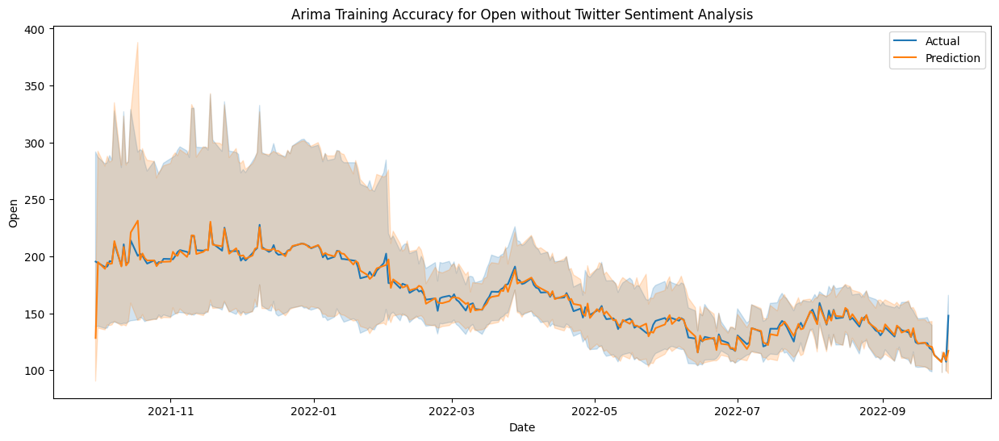

Training Mean Squared Error for Open Feature without Twitter: 116.85893056991128


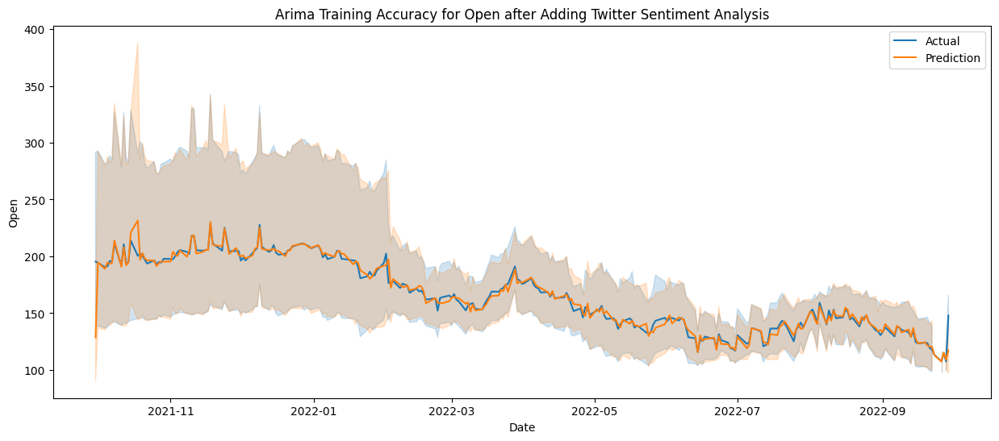

Training Mean Squared Error for Open Feature with Twitter: 117.24339415683359


In [113]:
from sklearn.metrics import mean_squared_error
import seaborn as sns

# Predictions for training data without Twitter
train_prediction_without_twitter = arima_model_for_open_without_twitter_fit.predict(exog=X_train_arima_without_twitter)
plt.figure(figsize=(15, 6))
sns.lineplot(x=y_train_arima.index, y=y_train_arima['Open'], label='Actual')
sns.lineplot(x=y_train_arima.index, y=train_prediction_without_twitter, label='Prediction')
plt.title('Arima Training Accuracy for Open without Twitter Sentiment Analysis')
plt.show()

mse_without_twitter = mean_squared_error(train_prediction_without_twitter, y_train_arima['Open'])
print(f'Training Mean Squared Error for Open Feature without Twitter: {mse_without_twitter}')

# Predictions for training data with Twitter
train_prediction_twitter = arima_model_for_open_twitter_fit.predict(exog=X_train_arima_twitter)
plt.figure(figsize=(15, 6))
sns.lineplot(x=y_train_arima.index, y=y_train_arima['Open'], label='Actual')
sns.lineplot(x=y_train_arima.index, y=train_prediction_twitter, label='Prediction')
plt.title('Arima Training Accuracy for Open after Adding Twitter Sentiment Analysis')
plt.show()

mse_with_twitter = mean_squared_error(train_prediction_twitter, y_train_arima['Open'])
print(f'Training Mean Squared Error for Open Feature with Twitter: {mse_with_twitter}')

In [91]:
train_prediction_without_twitter

950     154.649994
951     154.649994
952     154.649994
953     154.649994
954     154.649994
           ...    
1895    154.649994
1896    154.649994
1897    154.649994
1898    154.649994
1899    154.649994
Length: 950, dtype: float64

#Computing testing accuracy for open prices


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsm

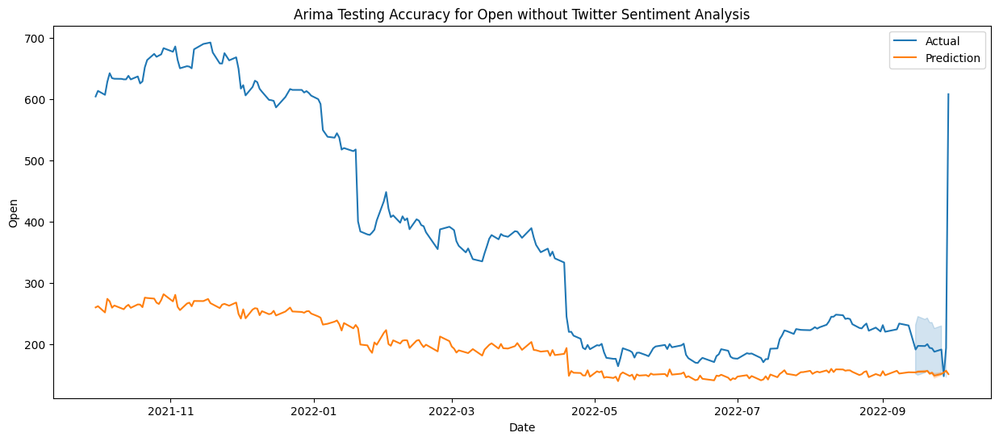

Testing Mean Squared Error for Open Feature without Twitter: 50537.85360376394


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


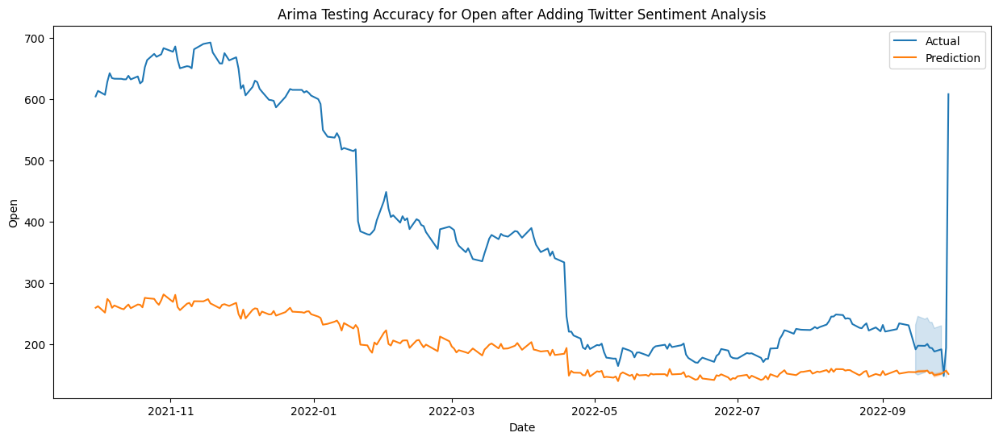

Testing Mean Squared Error for Open Feature with Twitter: 50684.67557495846


In [117]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import seaborn as sns

# Parameters for ARIMA model
order = (3, 1, 2)  # Replace with appropriate (p, d, q) values
seasonal_order = (1, 1, 1, 12)  # Replace with appropriate (P, D, Q, S) values

# For open data without Twitter
arima_model_for_open_without_twitter = ARIMA(y_train_arima['Open'], exog=X_train_arima_without_twitter,
                                             order=order, seasonal_order=seasonal_order)
arima_model_for_open_without_twitter_fit = arima_model_for_open_without_twitter.fit()

# For open data with Twitter
arima_model_for_open_twitter = ARIMA(y_train_arima['Open'], exog=X_train_arima_twitter,
                                     order=order, seasonal_order=seasonal_order)
arima_model_for_open_twitter_fit = arima_model_for_open_twitter.fit()

# Predictions for testing data without Twitter
test_prediction_without_twitter = arima_model_for_open_without_twitter_fit.predict(start=len(y_train_arima['Open']),
                                                                                    end=len(y_train_arima['Open']) + len(y_test_arima['Open']) - 1,
                                                                                    exog=X_test_arima_without_twitter)
plt.figure(figsize=(15, 6))
sns.lineplot(x=y_test_arima['Open'].index, y=y_test_arima['Open'], label='Actual')
sns.lineplot(x=y_test_arima['Open'].index, y=test_prediction_without_twitter, label='Prediction')
plt.title('Arima Testing Accuracy for Open without Twitter Sentiment Analysis')
plt.show()

mse_without_twitter = mean_squared_error(test_prediction_without_twitter, y_test_arima['Open'])
print(f'Testing Mean Squared Error for Open Feature without Twitter: {mse_without_twitter}')

# Predictions for testing data with Twitter
test_prediction_twitter = arima_model_for_open_twitter_fit.predict(start=len(y_train_arima['Open']),
                                                                   end=len(y_train_arima['Open']) + len(y_test_arima['Open']) - 1,
                                                                   exog=X_test_arima_twitter)
plt.figure(figsize=(15, 6))
sns.lineplot(x=y_test_arima['Open'].index, y=y_test_arima['Open'], label='Actual')
sns.lineplot(x=y_test_arima['Open'].index, y=test_prediction_twitter, label='Prediction')
plt.title('Arima Testing Accuracy for Open after Adding Twitter Sentiment Analysis')
plt.show()

mse_with_twitter = mean_squared_error(test_prediction_twitter, y_test_arima['Open'])
print(f'Testing Mean Squared Error for Open Feature with Twitter: {mse_with_twitter}')

#Arima model Training for Adjusted Close prices


#Computing training accuracy for Adjusted Close prices


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsm

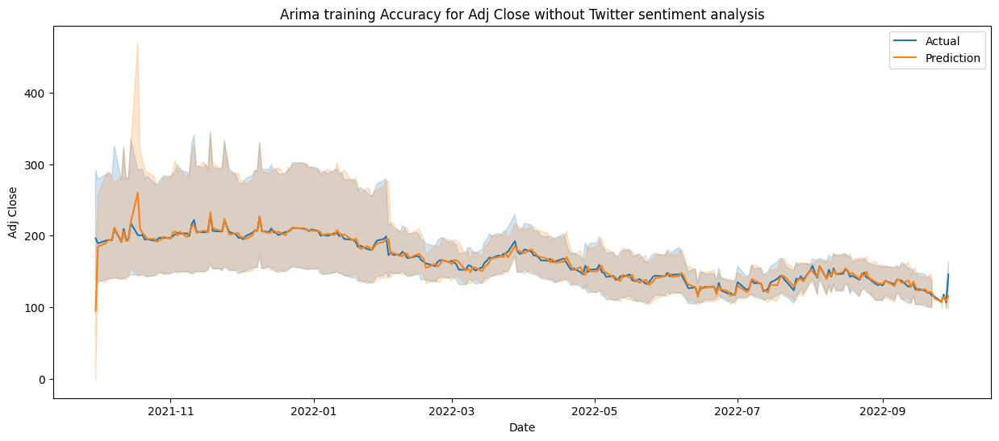

Training mean squared error for Adj Close feature without Twitter: 262.2726823787692


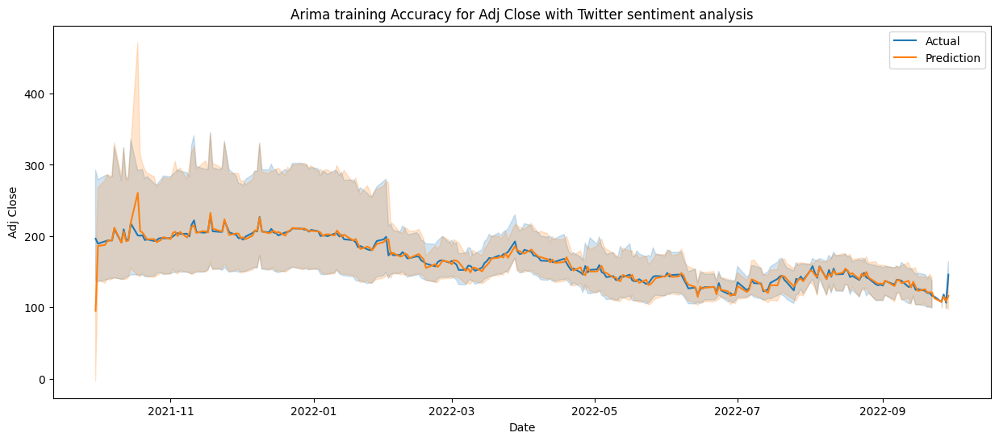

Training mean squared error for Adj Close feature with Twitter: 262.80408756038725


In [118]:

import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error


# Manual ARIMA parameters
d = 1
p = 2
q = 3
P = 1
D = 1
Q = 1
S = 12

# Fit the ARIMA model without Twitter data
arima_model_for_Adj_Close_without_twitter = sm.tsa.statespace.SARIMAX(
    y_train_arima['Adj Close'],
    exog=X_train_arima_without_twitter,
    order=(p, d, q),
    seasonal_order=(P, D, Q, S),
    enforce_stationarity=False,
    enforce_invertibility=False
)
results_without_twitter = arima_model_for_Adj_Close_without_twitter.fit()

# Fit the ARIMA model with Twitter data
arima_model_for_Adj_Close_twitter = sm.tsa.statespace.SARIMAX(
    y_train_arima['Adj Close'],
    exog=X_train_arima_twitter,
    order=(p, d, q),
    seasonal_order=(P, D, Q, S),
    enforce_stationarity=False,
    enforce_invertibility=False
)
results_with_twitter = arima_model_for_Adj_Close_twitter.fit()

# Predictions
train_prediction_without_twitter = results_without_twitter.get_prediction(
    start=0, end=len(y_train_arima)-1, exog=X_train_arima_without_twitter
)
train_prediction_twitter = results_with_twitter.get_prediction(
    start=0, end=len(y_train_arima)-1, exog=X_train_arima_twitter
)

# Plotting and evaluation
plt.figure(figsize=(15,6))

# Plot for without Twitter sentiment analysis
sns.lineplot(x=y_train_arima.index, y=y_train_arima['Adj Close'], label='Actual')
sns.lineplot(x=y_train_arima.index, y=train_prediction_without_twitter.predicted_mean, label='Prediction')
plt.title('Arima training Accuracy for Adj Close without Twitter sentiment analysis')
plt.show()

e = mean_squared_error(train_prediction_without_twitter.predicted_mean, y_train_arima['Adj Close'])
print(f'Training mean squared error for Adj Close feature without Twitter: {e}')

plt.figure(figsize=(15,6))

# Plot for with Twitter sentiment analysis
sns.lineplot(x=y_train_arima.index, y=y_train_arima['Adj Close'], label='Actual')
sns.lineplot(x=y_train_arima.index, y=train_prediction_twitter.predicted_mean, label='Prediction')
plt.title('Arima training Accuracy for Adj Close with Twitter sentiment analysis')
plt.show()

e = mean_squared_error(train_prediction_twitter.predicted_mean, y_train_arima['Adj Close'])
print(f'Training mean squared error for Adj Close feature with Twitter: {e}')

#Computing testing accuracy for Adjusted close prices


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsm

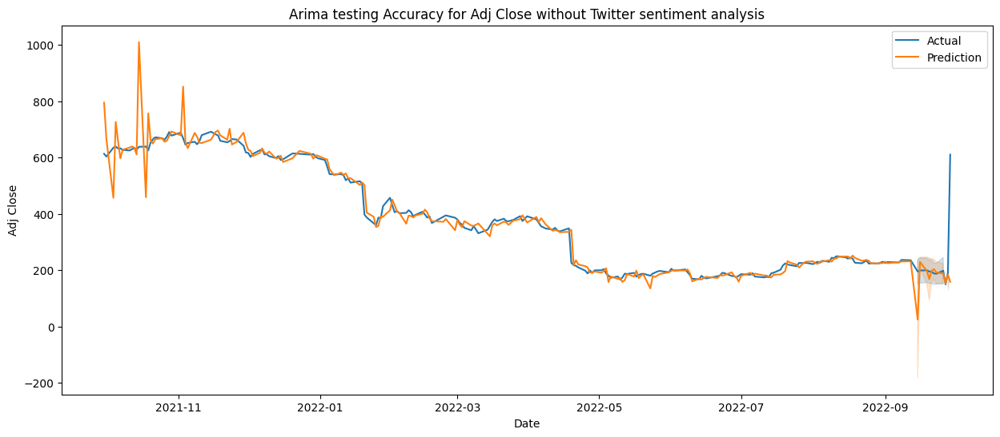

Testing mean squared error for Adj Close feature without Twitter: 2914.795990183008


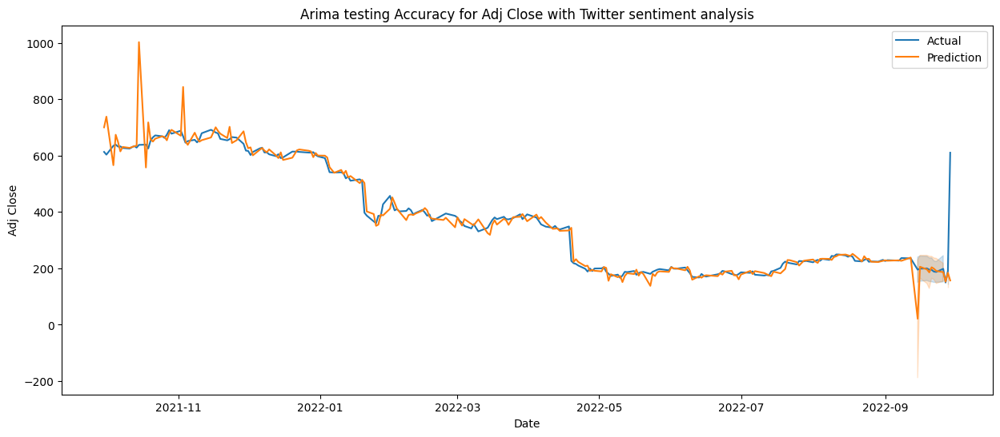

Testing mean squared error for Adj Close feature with Twitter: 2546.0785266546163


In [120]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error


d = 1
p = 2
q = 3
P = 1
D = 1
Q = 1
S = 12

# Fit the ARIMA model without Twitter data for testing
arima_model_for_Adj_Close_without_twitter = sm.tsa.statespace.SARIMAX(
    y_test_arima['Adj Close'],
    exog=X_test_arima_without_twitter,
    order=(p, d, q),
    seasonal_order=(P, D, Q, S),
    enforce_stationarity=False,
    enforce_invertibility=False
)
results_without_twitter = arima_model_for_Adj_Close_without_twitter.fit()

# Fit the ARIMA model with Twitter data for testing
arima_model_for_Adj_Close_twitter = sm.tsa.statespace.SARIMAX(
    y_test_arima['Adj Close'],
    exog=X_test_arima_twitter,
    order=(p, d, q),
    seasonal_order=(P, D, Q, S),
    enforce_stationarity=False,
    enforce_invertibility=False
)
results_with_twitter = arima_model_for_Adj_Close_twitter.fit()

# Predictions for testing data
test_prediction_without_twitter = results_without_twitter.get_prediction(
    start=0, end=len(y_test_arima)-1, exog=X_test_arima_without_twitter
)
test_prediction_twitter = results_with_twitter.get_prediction(
    start=0, end=len(y_test_arima)-1, exog=X_test_arima_twitter
)

# Plotting and evaluation for testing data
plt.figure(figsize=(15,6))

# Plot for testing without Twitter sentiment analysis
sns.lineplot(x=y_test_arima.index, y=y_test_arima['Adj Close'], label='Actual')
sns.lineplot(x=y_test_arima.index, y=test_prediction_without_twitter.predicted_mean, label='Prediction')
plt.title('Arima testing Accuracy for Adj Close without Twitter sentiment analysis')
plt.show()

e = mean_squared_error(test_prediction_without_twitter.predicted_mean, y_test_arima['Adj Close'])
print(f'Testing mean squared error for Adj Close feature without Twitter: {e}')

plt.figure(figsize=(15,6))

# Plot for testing with Twitter sentiment analysis
sns.lineplot(x=y_test_arima.index, y=y_test_arima['Adj Close'], label='Actual')
sns.lineplot(x=y_test_arima.index, y=test_prediction_twitter.predicted_mean, label='Prediction')
plt.title('Arima testing Accuracy for Adj Close with Twitter sentiment analysis')
plt.show()

e = mean_squared_error(test_prediction_twitter.predicted_mean, y_test_arima['Adj Close'])
print(f'Testing mean squared error for Adj Close feature with Twitter: {e}')

In [96]:
test_prediction_twitter

950     152.117645
951     152.117645
952     152.117645
953     152.117645
954     152.117645
           ...    
1183    152.117645
1184    152.117645
1185    152.117645
1186    152.117645
1187    152.117645
Length: 238, dtype: float64

#Forcasting for upcoming data


In [97]:


#Libraries that will help us extract only business days in the US.
#Otherwise our dates would be wrong when we look back (or forward).
from pandas.tseries.holiday import USFederalHolidayCalendar
from pandas.tseries.offsets import CustomBusinessDay

us_bd = CustomBusinessDay(calendar=USFederalHolidayCalendar())
#Remember that we can only predict one day in future as our model needs 5 variables
#as inputs for prediction. We only have all 5 variables until the last day in our dataset.
n_past_dates = 5
n_days_for_prediction = 5 #let us predict past 15 days

predict_period_dates = pd.date_range(list(df_for_training.index)[-n_past_dates], periods=n_days_for_prediction,
                                     freq=us_bd).tolist()
print(predict_period_dates)



[Timestamp('2022-09-22 00:00:00', freq='C'), Timestamp('2022-09-23 00:00:00', freq='C'), Timestamp('2022-09-26 00:00:00', freq='C'), Timestamp('2022-09-27 00:00:00', freq='C'), Timestamp('2022-09-28 00:00:00', freq='C')]


In [98]:
features= ['Open','High', 'Low','Close','Volume','Adj Close','P_mean']
df_for_training.iloc[-n_past:,:].to_numpy().reshape(1,n_past,len(features)).shape

(1, 5, 7)

#Make forcasting using LSTM


In [99]:
x_forcast=df_for_training.iloc[-n_past-1:-1,:]
x_forcast=scaler.transform(x_forcast).reshape(1,n_past,len(features))
prediction = cnn_lstm_model_twitter.predict(x_forcast) #shape = (n, 1) where n is the n_days_for_prediction
prediction=prediction.reshape(prediction.shape[0],prediction.shape[2])
#Perform inverse transformation to rescale back to original range
prediction=scaler_for_inference.inverse_transform(prediction)

# Convert timestamp to date
forecast_dates = []
for time_i in predict_period_dates:
    forecast_dates.append(time_i.date())

print(f'Date = {forecast_dates[-2]}, Prediction open {prediction[0][0]}')
print(f'Date = {forecast_dates[-2]}, Prediction Adjusted close {prediction[0][1]}')

1/1 [==============================] - 0s 90ms/step
Date = 2022-09-27, Prediction open 228.34698486328125
Date = 2022-09-27, Prediction Adjusted close 228.46725463867188


In [107]:
import pickle
pickle.dump(cnn_lstm_model_twitter, open('model.pkl', 'wb'))


In [106]:
import pickle
with open(r'cnn_lstm_model_twitter.pkl','wb') as model_pkl:
    pickle.dump(cnn_lstm_model_twitter, model_pkl, protocol=2)

#Forcasting for upcoming data using Arima


In [100]:
x_forcast=X_arima[X_arima.index =='2022-07-07']
x_forcast

,High,Low,Close,Volume,P_mean,Adj Close_feature,open_feature_feature
Date,,,,,,,
2022-07-07,172.720001,167.779999,172.190002,24083400.0,0.000000,172.190002,169.449997
2022-07-07,116.989998,113.489998,116.330002,57872300.0,-0.142857,116.330002,113.849998
2022-07-07,119.862000,115.533997,119.306000,32184000.0,-0.200000,119.306000,116.008003
2022-07-07,146.550003,143.279999,146.350006,66253700.0,0.142857,145.904968,143.289993
2022-07-07,190.210007,183.500000,189.270004,6334500.0,0.000000,189.270004,184.270004


In [121]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

x_forcast=X_arima[X_arima.index =='2022-07-07']
x_forcast

# Manual ARIMA parameters (same as in the training phase)
d = 1
p = 2
q = 3
P = 1
D = 1
Q = 1
S = 12

# Fit the ARIMA model with Twitter data for open price
arima_model_for_open_twitter = sm.tsa.statespace.SARIMAX(
    y_train_arima['Open'],  # Assuming y_train_arima contains 'Open' prices
    exog=X_train_arima_twitter,
    order=(p, d, q),
    seasonal_order=(P, D, Q, S),
    enforce_stationarity=False,
    enforce_invertibility=False
)
results_for_open_twitter = arima_model_for_open_twitter.fit()

# Fit the ARIMA model with Twitter data for Adjusted Close price
arima_model_for_Adj_Close_twitter = sm.tsa.statespace.SARIMAX(
    y_train_arima['Adj Close'],
    exog=X_train_arima_twitter,
    order=(p, d, q),
    seasonal_order=(P, D, Q, S),
    enforce_stationarity=False,
    enforce_invertibility=False
)
results_for_Adj_Close_twitter = arima_model_for_Adj_Close_twitter.fit()

# Predictions for the forecast date
open_prediction = results_for_open_twitter.get_prediction(
    start=0, end=len(x_forcast)-1, exog=x_forcast
).predicted_mean.iloc[-1]
adj_close_prediction = results_for_Adj_Close_twitter.get_prediction(
    start=0, end=len(x_forcast)-1, exog=x_forcast
).predicted_mean.iloc[-1]

# Print the predictions
print(f'Forecast Date: {x_forcast.index[0]}')
print(f'Predicted Open Price: {open_prediction}')
print(f'Predicted Adjusted Close Price: {adj_close_prediction}')

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsm

Forecast Date: 2022-07-07 00:00:00
Predicted Open Price: 344.2379797491659
Predicted Adjusted Close Price: 333.17446455212513


In [123]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(trainX, trainY, test_size=0.2, random_state=42)

print('X_train shape = {}.'.format(X_train.shape))
print('y_train shape = {}.'.format(y_train.shape))
print('X_test shape = {}.'.format(X_test.shape))
print('y_test shape = {}.'.format(y_test.shape))


X_train shape = (947, 5, 7).
y_train shape = (947, 1, 2).
X_test shape = (237, 5, 7).
y_test shape = (237, 1, 2).


In [124]:
# Assuming y_train and y_test are in the shape of (n_samples, 1, 2)
# Convert y_train and y_test into two-dimensional arrays with shape (n_samples,)
y_train_class = np.argmax(y_train.squeeze(), axis=1)
y_test_class = np.argmax(y_test.squeeze(), axis=1)

# Now y_train_class and y_test_class will have shape (n_samples,) representing the class labels

# Perform binary classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Create the Random Forest classifier
random_forest_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the classifier on the training data
random_forest_classifier.fit(X_train.reshape((X_train.shape[0], -1)), y_train_class)

# Make predictions on the test data
y_pred_class = random_forest_classifier.predict(X_test.reshape((X_test.shape[0], -1)))

# Calculate accuracy score
accuracy = accuracy_score(y_test_class, y_pred_class)
print(f'Classification Accuracy: {accuracy}')


Classification Accuracy: 0.5274261603375527


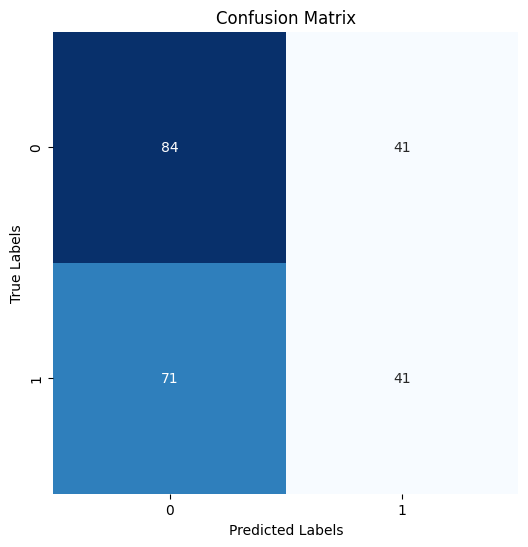

Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.67      0.60       125
           1       0.50      0.37      0.42       112

    accuracy                           0.53       237
   macro avg       0.52      0.52      0.51       237
weighted avg       0.52      0.53      0.52       237



In [125]:
from sklearn.metrics import confusion_matrix, classification_report

# Plot confusion matrix
cm = confusion_matrix(y_test_class, y_pred_class)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Plot classification report
report = classification_report(y_test_class, y_pred_class)
print('Classification Report:')
print(report)


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

# Reshape the input data to flatten the time steps and features
input_shape = X_train.shape[1] * X_train.shape[2]
X_train_flatten = X_train.reshape((X_train.shape[0], input_shape))
X_test_flatten = X_test.reshape((X_test.shape[0], input_shape))

# Create the DNN model
def create_model(neurons=64, dropout_rate=0.2):
    model = Sequential()
    model.add(Dense(neurons, activation='relu', input_shape=(input_shape,)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(neurons, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(neurons, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Define the hyperparameter grid
param_grid = {
    'neurons': [64, 128, 256],
    'dropout_rate': [0.2, 0.3, 0.4],
    'batch_size': [32, 64, 128],
    'epochs': [10, 20, 30]
}

# Create the DNN model as a scikit-learn estimator
model = tf.keras.wrappers.scikit_learn.KerasClassifier(build_fn=create_model, verbose=0)

# Use GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='accuracy', verbose=1)
grid_search_result = grid_search.fit(X_train_flatten, y_train_class)

# Get the best hyperparameters and accuracy
best_params = grid_search_result.best_params_
best_accuracy = grid_search_result.best_score_
print("Best Hyperparameters:", best_params)
print("Best Accuracy:", best_accuracy)

# Train the final model with the best hyperparameters
final_model = create_model(neurons=best_params['neurons'], dropout_rate=best_params['dropout_rate'])
final_model.fit(X_train_flatten, y_train_class, epochs=best_params['epochs'], batch_size=best_params['batch_size'], verbose=1)

# Make predictions on the test data
y_pred_proba = final_model.predict(X_test_flatten)
y_pred_class = (y_pred_proba > 0.5).astype(int)

# Calculate accuracy score
accuracy = accuracy_score(y_test_class, y_pred_class)
print(f'Classification Accuracy on Test Set: {accuracy}')


Fitting 3 folds for each of 81 candidates, totalling 243 fits


<ipython-input-126-f6dc5cf559c9>:37: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = tf.keras.wrappers.scikit_learn.KerasClassifier(build_fn=create_model, verbose=0)


10/10 [==============================] - 0s 2ms/step
